<a href="https://colab.research.google.com/github/thiagocquinto/datascience/blob/main/MVP2_Thiago_Quinto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning & Analytics

**Thiago Correa do Quinto**

##1. Modelo utilizando métodos clássicos para um problema de classificação(MVP 2.a)

O conjunto dados utilizado neste projeto é **Heart Attack Analysis & Prediction Dataset** muito usado para a tarefa de classificação e previsão de ataques cardíacos. Ele contém informações médicas relevantes e características de pacientes que foram coletadas para fins de análise e previsão de ataques cardíacos.

A análise e previsão de ataques cardíacos são cruciais para a saúde pública, pois permitem a implementação de medidas preventivas e intervenções médicas precoces para reduzir o risco de eventos cardiovasculares graves.

O objetivo deste projeto é criar um modelo de classificação capaz de prever se um paciente está em risco de sofrer um ataque cardíaco com base nas características fornecidas.

Características (Features):

**Age** : Idade do paciente

**Sex** : Sexo do paciente

**exang**: angina induzida por atividade física (1 = sim; 0 = não)

**caa**: número de vasos principais (0-3)

**cp** : Tipo de dor no peito

>*Valor 1*: angina típica

>*Valor 2*: angina atípica

>*Valor 3*: dor não anginosa

>*Valor 4*: assintomático

**trtbps** : pressão arterial em repouso (em mm Hg)

**chol** : colesterol em mg/dl medido via sensor IMC

**fbs** : (açúcar no sangue em jejum > 120 mg/dl) (1 = verdadeiro; 0 = falso)

**rest_ecg** : resultados eletrocardiográficos em repouso

>*Valor 0*: normal

>*Valor 1*: tendo anormalidade da onda ST-T (inversões da onda T e/ou elevação ou depressão ST > 0,05 mV)

>*Valor 2*: mostrando hipertrofia ventricular esquerda provável ou definitiva pelos critérios de Estes

**thalach** : frequência cardíaca máxima alcançada

**old peak**:  depressão do ST induzida pelo exercício em relação ao repouso

**slp**: a inclinação do pico do segmento ST do exercício

>*0* = sem inclinação

>*1* = plano

>*2* = descendente

**thall**: talassemia

>*0* = nulo

>*1* = defeito fixo

>*2* = normais

>*3* = defeito reversível

**target** :
>*0* = menor chance de ataque cardíaco

>*1* = grande chance de ataque cardíaco

Fonte: O conjunto de dados pode ser originado de várias fontes, incluindo repositórios de dados abertos, como Kaggle (https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset).

In [1]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Importação de bibliotecas necessárias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score

from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier # algoritmo Árvore de Regressão
from sklearn.neighbors import KNeighborsClassifier # algoritmo KNN
from sklearn.naive_bayes import GaussianNB # algoritmo Naive Bayes
from sklearn.svm import SVC # algoritmo SVM

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier # ExtraTrees, para a importância de Atributos
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import KFold

from sklearn.feature_selection import SelectKBest # para a seleção univariada
from sklearn.feature_selection import f_classif # para o teste ANOVA da seleção univariada
from sklearn.feature_selection import RFE # para a Eliminação Recursiva de atributos
from sklearn.linear_model import LogisticRegression # Regressão Logística, para a eliminação recursiva de atributos

###1. Carga de Dados

In [3]:
# importando dados de url para um dataframe

# url a importar
url_dados='https://raw.githubusercontent.com/thiagocquinto/datasets/main/heart.csv'

dataset=pd.read_csv(url_dados, delimiter=',')

display(dataset.head()) # foram carregadas 5 linhas para ter uma visão melhor dos dados do dataset

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


###2. Análise dos Dados

In [4]:
print(dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trtbps    303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalachh  303 non-null    int64  
 8   exng      303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slp       303 non-null    int64  
 11  caa       303 non-null    int64  
 12  thall     303 non-null    int64  
 13  output    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB
None


Dataset com dimensão de 303 linhas por 14 colunas

In [5]:
dataset.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


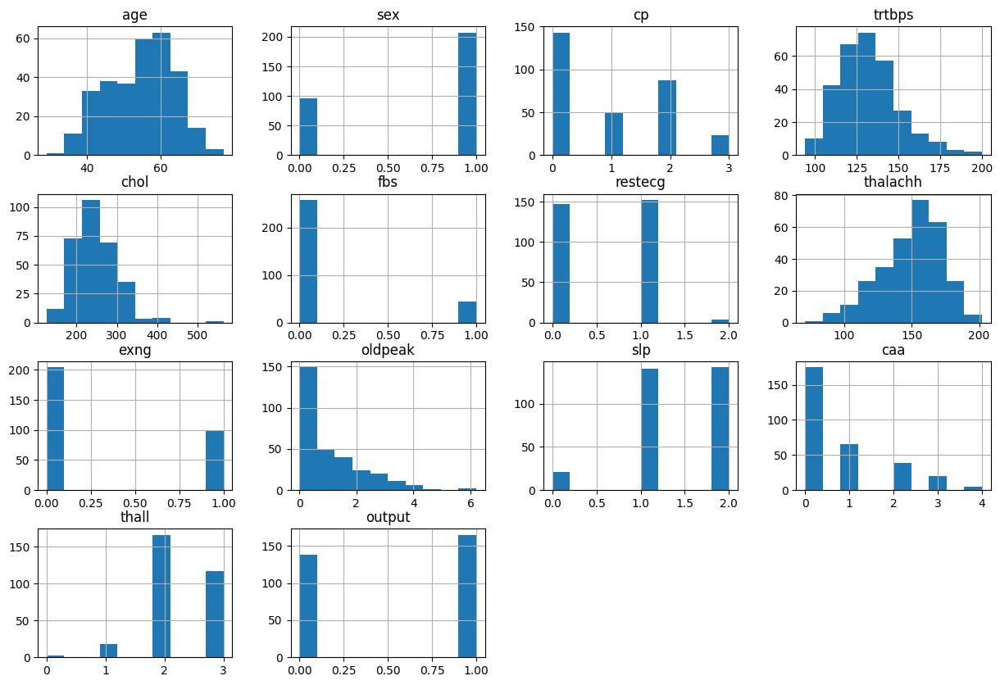

In [6]:
dataset.hist(figsize = (15,10));

As colunas age, trtbps, chol,thalachh e oldpeak apresentam distribuição de dados com valores discretos enquanto os as outras colunas apresentam dados categóricos. Há um ligeiro desbalanceamento na variável de saída output.

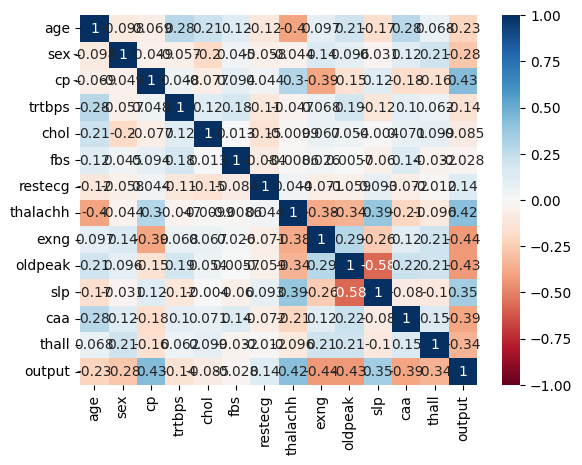

In [7]:
# Matriz de Correlação com Matplotlib Seaborn - mudança de escala de cores entre -1 e 1
sns.heatmap(dataset.corr(), annot=True, cmap='RdBu',vmin=-1, vmax=1);

In [8]:
# verificando nulls no dataset
dataset.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

O dataset não possui valores nulos, não sendo necessário nenhum tratamento de missings

###3. Pré-processamento dos dados

In [9]:
# Preparação dos dados

# Separação em bases de treino e teste (holdout)
array=dataset.values
X=array[:,0:13] # atributos
y=array[:,13] # classe (target)

In [10]:
# SelectKBest

# Seleção de atributos com SelectKBest
best_var = SelectKBest(score_func=f_classif,k=7)

# Executa a função de pontuação em (X,y) e obtém os atributos selecionados
fit = best_var.fit(X,y)

# Reduz X para os atributos selecionados
features=fit.transform(X)

# Resultados
print('\nNúmero original de atributos: ', X.shape[1])
print('\nNúmero reduzido de atributos: ', features.shape[1])

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe as pontuações de cada atributo e os 4 escolhidos (com as pontuações mais altas)
np.set_printoptions(precision=3) # 3 casas decimais
print('\nScores dos Atributos Originais: ', fit.scores_)
print('\nAtributos Selecionados: ', best_var.get_feature_names_out(input_features=dataset.columns[0:13]))


Número original de atributos:  13

Número reduzido de atributos:  7

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Scores dos Atributos Originais:  [16.117 25.792 69.772  6.458  2.203  0.237  5.777 65.12  70.952 68.551
 40.902 54.56  40.408]

Atributos Selecionados:  ['cp' 'thalachh' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


In [11]:
# Eliminação Recursiva de Atributos

# Criação do modelo
modelo=LogisticRegression(max_iter=200)

# Eliminação Recursiva de Atributos
rfe=RFE(modelo,n_features_to_select=7)
fit=rfe.fit(X,y)

# Print dos resultados
print('Atributos Originais: ', dataset.columns[0:13])

# Exibe os atributos selecionados (marcados como True em 'Atributos Selecionados')
# e com valor 1 em 'Ranking dos Atributos')
print('\nAtributos Selecionados: %s' % fit.support_)
print('\nRanking de atributos: %s' % fit.ranking_)
print('\nQtd de melhores Atributos: %d' % fit.n_features_)
print('\nNomes dos Atributos Selecionados: %s' % fit.get_feature_names_out(input_features=dataset.columns[0:13]))

Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')

Atributos Selecionados: [False  True  True False False False False False  True  True  True  True
  True]

Ranking de atributos: [6 1 1 5 7 3 2 4 1 1 1 1 1]

Qtd de melhores Atributos: 7

Nomes dos Atributos Selecionados: ['sex' 'cp' 'exng' 'oldpeak' 'slp' 'caa' 'thall']


Ambos os critérios utilizados para redução de atributos quase convergiram para as mesmas colunas. Nessa seleção somente a coluna sex e thalachh diverge em cada técnica.

In [12]:
# Importância de Atributos com ExtraTrees

# Criação do modelo para seleção de atributos
modelo=ExtraTreesClassifier(n_estimators=100)
modelo.fit(X,y)

# Exibe os atributos originais
print('\nAtributos Originais: ', dataset.columns[0:13])

# Exibe a pontuação de importância para cada atributo (quanto maior a pontuação mais importante é o atributo)
print(modelo.feature_importances_)


Atributos Originais:  Index(['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh',
       'exng', 'oldpeak', 'slp', 'caa', 'thall'],
      dtype='object')
[0.073 0.06  0.127 0.063 0.058 0.02  0.036 0.083 0.107 0.089 0.07  0.119
 0.096]


Pelo resultado da importância de atributos, a técnica mais aderente foi a Eliminação Recursiva de Atributos.

#### Separação de conjunto de treino e teste

In [13]:
test_size=0.20 # tamanho do conjunto de teste
seed=7 # semente aleatória

# Separação em conjuntos de treino e teste
array=dataset.values
X=array[:,0:13]
y=array[:,13]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=test_size,shuffle=True, random_state=seed,stratify=y) # holdout com estratificação

# Parâmetros e partições da validação cruzada
scoring='accuracy'
num_particoes=10
kfold=StratifiedKFold(n_splits=num_particoes,shuffle=True,random_state=seed) # validação cruzada com estratificação

####Modelos e Parâmetros de Votação

In [14]:
np.random.seed(7) # definindo uma semente global

# Lista que armazenará o modelo
models=[]

# Criando os modelos e adicionando-os na lista de modelos
models.append(('LR',LogisticRegression(max_iter=200)))
models.append(('KNN',KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB',GaussianNB()))
models.append(('SVM',SVC()))

# Definindo os parâmetros do classificador base para o BaggingClassifier
base=DecisionTreeClassifier()
num_trees=100
max_features=3

# Criando os modelos para o VotingClassifier
bases=[]
model1=LogisticRegression(max_iter=200)
bases.append(('logistic',model1))
model2=DecisionTreeClassifier()
bases.append(('cart',model2))
model3=SVC()
bases.append(('svm',model3))

####Pipeline

In [15]:
# Listas para armazenar os pipelines e os resultados para todas as visões do dataset
pipelines=[]
results=[]
names=[]

# Criando os elementos do pipeline

# Algoritmos que serão utilizados
reg_log=('LR',LogisticRegression(max_iter=200))
knn=('KNN',KNeighborsClassifier())
cart=('CART', DecisionTreeClassifier())
naives_bayes=('NB',GaussianNB())
svm=('SVM',SVC())
bagging=('Bagging',BaggingClassifier(base_estimator=base,n_estimators=num_trees))
random_forest=('RF',RandomForestClassifier(n_estimators=num_trees,max_features=max_features))
extra_trees=('ET',ExtraTreesClassifier(n_estimators=num_trees,max_features=max_features))
adaboost=('Ada',AdaBoostClassifier(n_estimators=num_trees))
gradient_boosting=('GB',GradientBoostingClassifier(n_estimators=num_trees))
voting=('Voting',VotingClassifier(bases))

# Transformações que serão utilizadas
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())


LR-orig: 0.838667 (0.051228)
KNN-orig: 0.636333 (0.084741)
CART-orig: 0.793333 (0.078436)
NB-orig: 0.826000 (0.100519)
SVM-orig: 0.636167 (0.078881)
Bag-orig: 0.809833 (0.083837)
RF-orig: 0.821833 (0.065547)
ET-orig: 0.821500 (0.091940)
Ada-orig: 0.764167 (0.100836)
GB-orig: 0.813833 (0.077796)
Vot-orig: 0.793167 (0.062323)
LR-padr: 0.822167 (0.059414)
KNN-padr: 0.809500 (0.072999)
CART-padr: 0.784833 (0.064706)
NB-padr: 0.826000 (0.100519)
SVM-padr: 0.825500 (0.093369)
Bag-padr: 0.830167 (0.092510)
RF-padr: 0.822333 (0.055853)
ET-padr: 0.829833 (0.076178)
Ada-padr: 0.764167 (0.100836)
GB-padr: 0.809667 (0.086226)
Vot-padr: 0.822000 (0.053587)
LR-norm: 0.817667 (0.084466)
KNN-norm: 0.829667 (0.071553)
CART-norm: 0.789000 (0.086747)
NB-norm: 0.826000 (0.100519)
SVM-norm: 0.846167 (0.087775)
Bag-norm: 0.805333 (0.097228)
RF-norm: 0.826333 (0.076568)
ET-norm: 0.813167 (0.099612)
Ada-norm: 0.764167 (0.100836)
GB-norm: 0.805500 (0.089935)
Vot-norm: 0.826000 (0.069969)


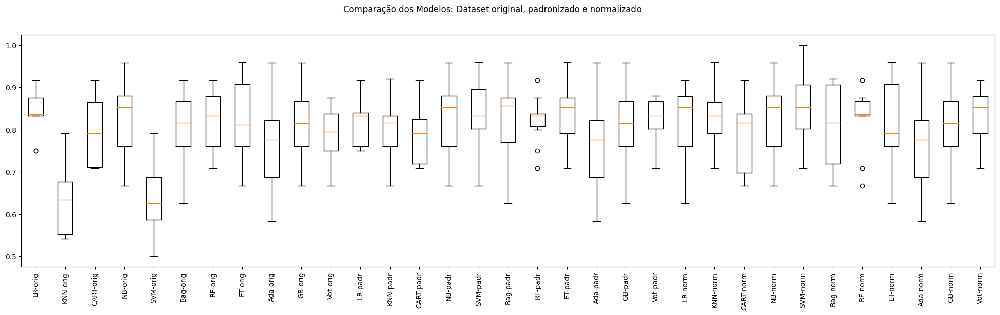

In [16]:
# Montando os pipelines

# Dataset original
pipelines.append(('LR-orig',Pipeline([reg_log])))
pipelines.append(('KNN-orig',Pipeline([knn])))
pipelines.append(('CART-orig',Pipeline([cart])))
pipelines.append(('NB-orig',Pipeline([naives_bayes])))
pipelines.append(('SVM-orig',Pipeline([svm])))
pipelines.append(('Bag-orig',Pipeline([bagging])))
pipelines.append(('RF-orig',Pipeline([random_forest])))
pipelines.append(('ET-orig',Pipeline([extra_trees])))
pipelines.append(('Ada-orig',Pipeline([adaboost])))
pipelines.append(('GB-orig',Pipeline([gradient_boosting])))
pipelines.append(('Vot-orig',Pipeline([voting])))

# Dataset padronizado
pipelines.append(('LR-padr',Pipeline([standard_scaler,reg_log])))
pipelines.append(('KNN-padr',Pipeline([standard_scaler,knn])))
pipelines.append(('CART-padr',Pipeline([standard_scaler,cart])))
pipelines.append(('NB-padr',Pipeline([standard_scaler,naives_bayes])))
pipelines.append(('SVM-padr',Pipeline([standard_scaler,svm])))
pipelines.append(('Bag-padr',Pipeline([standard_scaler,bagging])))
pipelines.append(('RF-padr',Pipeline([standard_scaler,random_forest])))
pipelines.append(('ET-padr',Pipeline([standard_scaler,extra_trees])))
pipelines.append(('Ada-padr',Pipeline([standard_scaler,adaboost])))
pipelines.append(('GB-padr',Pipeline([standard_scaler,gradient_boosting])))
pipelines.append(('Vot-padr',Pipeline([standard_scaler,voting])))

# Dataset normalizado
pipelines.append(('LR-norm',Pipeline([min_max_scaler,reg_log])))
pipelines.append(('KNN-norm',Pipeline([min_max_scaler,knn])))
pipelines.append(('CART-norm',Pipeline([min_max_scaler,cart])))
pipelines.append(('NB-norm',Pipeline([min_max_scaler,naives_bayes])))
pipelines.append(('SVM-norm',Pipeline([min_max_scaler,svm])))
pipelines.append(('Bag-norm',Pipeline([min_max_scaler,bagging])))
pipelines.append(('RF-norm',Pipeline([min_max_scaler,random_forest])))
pipelines.append(('ET-norm',Pipeline([min_max_scaler,extra_trees])))
pipelines.append(('Ada-norm',Pipeline([min_max_scaler,adaboost])))
pipelines.append(('GB-norm',Pipeline([min_max_scaler,gradient_boosting])))
pipelines.append(('Vot-norm',Pipeline([min_max_scaler,voting])))

# Executando os pipelines
for name, model in pipelines:
  cv_results=cross_val_score(model,X_train,y_train,cv=kfold,scoring=scoring)
  results.append(cv_results)
  names.append(name)
  msg= '%s: %f (%f)' % (name,cv_results.mean(),cv_results.std())
  print(msg)

# Boxplot de comparação dos modelos
fig=plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos: Dataset original, padronizado e normalizado')
ax= fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names,rotation=90)
plt.show()

Podemos perceber que após a validação cruzada, o melhor classificador foi o SVM-norm com 0.846167 de acurácia. Este classificador seguirá para a etapa de Tuning

####Tunning do Classificador

In [17]:
# Tuning do SVC
np.random.seed(7) # definindo semente global para este bloco

pipelines=[]

# Definindo os componentes do pipeline
svm=('SVM',SVC())
standard_scaler=('StandardScaler',StandardScaler())
min_max_scaler=('MinMaxScaler',MinMaxScaler())

pipelines.append(('SVM-orig',Pipeline([svm])))
pipelines.append(('SVM-padr',Pipeline([standard_scaler,svm])))
pipelines.append(('SVM-norm',Pipeline([min_max_scaler,svm])))

param_grid={
    'SVM__C': [0.1, 1, 10, 100, 1000],
    'SVM__gamma': [1, 0.1, 0.01, 0.001, 0.0001],
    'SVM__kernel': ['rbf','sigmoid']
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
  grid=GridSearchCV(estimator=model,param_grid=param_grid,scoring=scoring,cv=kfold)
  grid.fit(X_train,y_train)
  #imprime a melhor configuração
  print('Sem tratamento de missings: %s - Melhor: %f usando %s' % (name,grid.best_score_, grid.best_params_))

Sem tratamento de missings: SVM-orig - Melhor: 0.780500 usando {'SVM__C': 100, 'SVM__gamma': 0.0001, 'SVM__kernel': 'rbf'}
Sem tratamento de missings: SVM-padr - Melhor: 0.830333 usando {'SVM__C': 1000, 'SVM__gamma': 0.001, 'SVM__kernel': 'sigmoid'}
Sem tratamento de missings: SVM-norm - Melhor: 0.846333 usando {'SVM__C': 1, 'SVM__gamma': 1, 'SVM__kernel': 'rbf'}


Os melhores parâmetros para o SVM foi o utilizado no SVM-norm: C: 1; gamma: 1 e kernel: rbf

####Avaliação do Conjunto teste

In [18]:
# Avaliação do modelo com conjunto de teste

# Preparação do modelo
scaler=MinMaxScaler().fit(X_train) # ajuste do scaler com o conjunto de treino
rescaledX=scaler.transform(X_train) # aplicação da padronização no conjunto de treino
model=SVC(C=1,gamma=1,kernel='rbf')
model.fit(rescaledX,y_train)

# Estimativa da acurácia no conjunto de teste
rescaledTestX=scaler.transform(X_test) # aplicação da padronização no conjunto de teste
predictions=model.predict(rescaledTestX)
print(accuracy_score(y_test,predictions))

0.819672131147541


In [19]:
# Matriz de Confusão
confusion_matrix(y_test,predictions)

array([[20,  8],
       [ 3, 30]])

Por se tratar de um conjunto de dados muito sensível, onde falsos positivos podem impactar um diagnóstico assertivo, a matriz de confusão demonstra que o modelo tem uma boa aderência associada a uma acurácia de 0.8197.

##2. Modelo utilizando Deep Learning para um problema de visão computacional (MVP 2.b)

O conjunto de dados "Natural Human Face Images for Emotion Recognition" é um dataset utilizado em problemas de visão computacional e tem como objetivo reconhecer emoções em rostos humanos. Ele contém imagens de rostos de pessoas em diferentes emoções, capturadas em condições naturais. Esse tipo de dataset é amplamente utilizado em pesquisas relacionadas à detecção e reconhecimento de emoções em imagens.

O reconhecimento de expressões faciais geralmente usa conjuntos de dados padrão como FER, CK+ e KDEF para aprendizado de máquina. Aqui está uma tentativa de fornecer dados adicionais para rostos humanos reais coletados na Internet e anotados manualmente.

São mais de 5.500 imagens com 8 categorias de emoções – raiva, desprezo, nojo, medo, felicidade, neutralidade, tristeza e surpresa. Todas as imagens contêm rosto humano em tons de cinza (ou esboço). Cada imagem tem 224 x 224 pixels em escala de cinza no formato PNG.

O reconhecimento de emoções em imagens de rostos humanos é uma tarefa desafiadora e importante em visão computacional. Essa habilidade é valiosa em aplicações como atendimento ao cliente, detecção de estresse e emoções em ambientes de trabalho, interações de robôs com humanos e análise de reações de consumidores em resposta a campanhas publicitárias, entre outras.

Fonte: O conjunto de dados pode ser proveniente de várias fontes, incluindo repositórios públicos, bancos de dados de pesquisa ou coletas de dados específicas para estudos de emoção em imagens de rostos humanos no kaggle (https://www.kaggle.com/datasets/sudarshanvaidya/random-images-for-face-emotion-recognition).

In [20]:
!pip install gdown # instala pacote do gdown para realizar download de arquivo no Google Drive

In [21]:
# importar bibliotecas

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing import image
import os
import gdown
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display
from keras import regularizers
from keras.optimizers import Adam

In [22]:
# Utilidades
# plot_confusion_matrix é uma função python que imprime uma matriz de confusão

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

###1. Carga de Dados

In [23]:
file_id = "11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_"
url = f"https://drive.google.com/uc?id={file_id}"

folder_path = "./dataset"  # especifique a pasta onde baixara o arquivo
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/emotions.zip"  # especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=11ZvtedV401A3y2BFvCZcqd7fwPfuZCM_
To: /content/dataset/emotions.zip
100%|██████████| 47.8M/47.8M [00:00<00:00, 118MB/s]


'dataset/emotions.zip'

In [24]:
# Path onde se encontra o arquivo 'emotions.zip'
train = 'dataset/emotions.zip'
destination = 'dataset/images/'

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

# descompactação do arquivo emotions.zip na pasta de destino
with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

###2. Análise dos Dados

In [25]:
# verifica a pasta de destino, focado no subdiretórios
subdir=os.listdir(destination)
print(subdir)

['sadness', 'fear', 'neutrality', 'anger', 'happiness', 'disgust', 'surprise', 'contempt']


In [26]:
# verifica cada subdiretório e conta quantos arquivos para cada pasta
for sub in subdir:
  print(sub+": "+str(len((os.listdir(destination+'/'+sub)))))

sadness: 746
fear: 570
neutrality: 524
anger: 890
happiness: 1406
disgust: 439
surprise: 775
contempt: 208


In [27]:
# construção de dataset com os dados dos arquivos
images, paths, labels, heights, widths, filesize = [], [], [], [], [],[]

for sub in subdir:
  path = destination+sub
  files = os.listdir(path)

  # Loop que percorre cada uma das imagens extraídas
  for fname in files:
      images.append(fname)
      paths.append(path+'/')
      labels.append(sub)
      img_shape = mpimg.imread(path+'/'+fname).shape
      heights.append(img_shape[0])
      widths.append(img_shape[1])
      filesize.append(os.path.getsize(path+'/'+fname))

      # copia os as imagens de cada subdiretório para o diretório de destino
      shutil.copy2(os.path.join(path, fname), destination)

# Criação do dataset
df = pd.DataFrame({'image': images, 'path': paths, 'class': labels,
                   'height': heights,'width': widths,  'filesize': filesize})

In [28]:
# visualização do dataset
df.head()

,image,path,class,height,width,filesize
0,images - 2020-11-06T201618.925_face.png,dataset/images/sadness/,sadness,224,224,15539
1,31549147738_fe99890010_b_face.png,dataset/images/sadness/,sadness,224,224,32004
2,images - 2020-11-06T201604.022_face.png,dataset/images/sadness/,sadness,224,224,12558
3,images - 2020-11-06T195236.984_face.png,dataset/images/sadness/,sadness,224,224,4267
4,images - 2020-11-06T181828.625_face.png,dataset/images/sadness/,sadness,224,224,5750


happiness     1406
anger          890
surprise       775
sadness        746
fear           570
neutrality     524
disgust        439
contempt       208
Name: class, dtype: int64


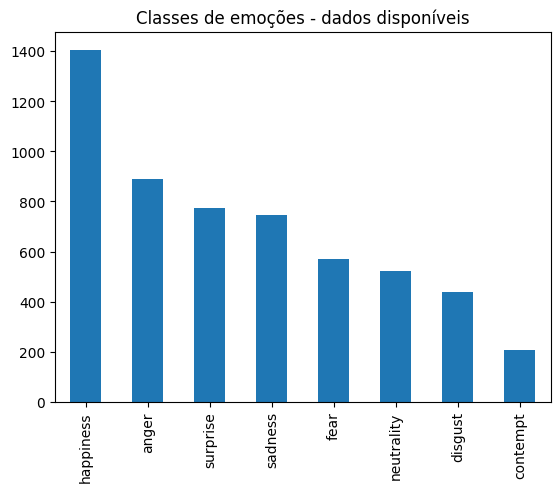

In [29]:
# avaliação dos dados através do dataset
print((df['class']).value_counts())
emotions_count = df['class'].value_counts().plot.bar(title='Classes de emoções - dados disponíveis')

Como podemos perceber, o dataset possui um desbalanceamento para cada classe, o que pode dificultar o treinamento do modelo.

###3. Pré-processamento dos dados

In [30]:
# parâmetros básicos que serão utilizados
batch_size = 32
img_height = 224
img_width = 224
num_classes = 8

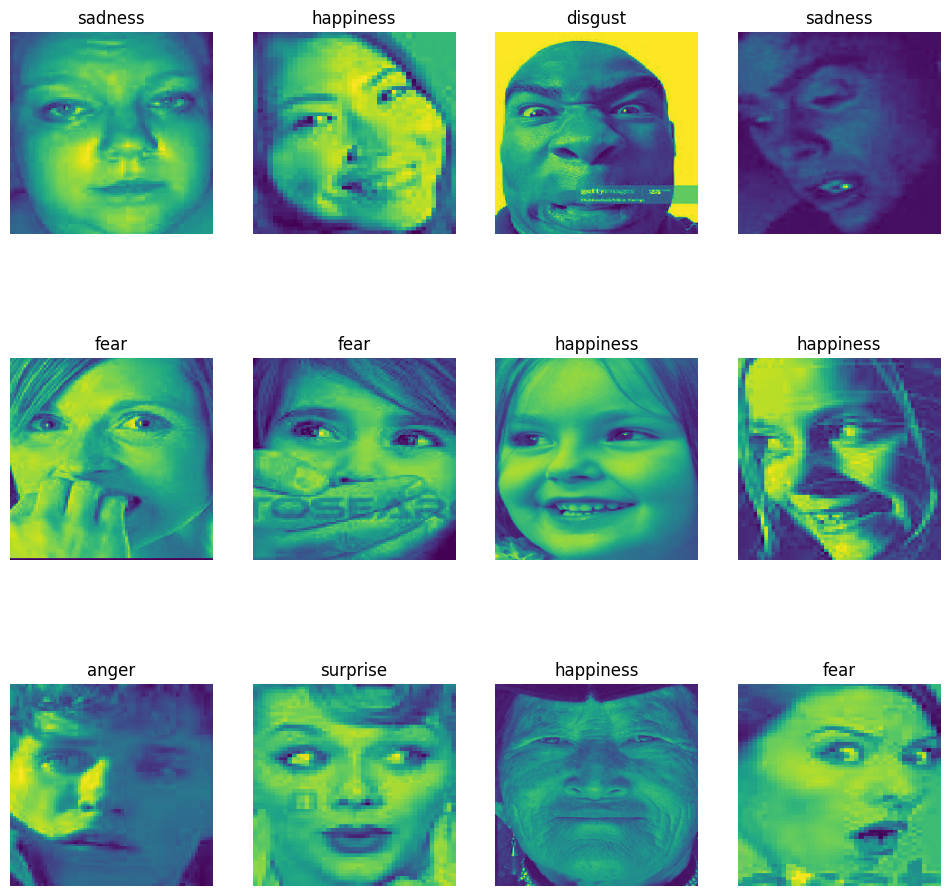

In [31]:
# Pré-visualização das imagens
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = df.sample()
    img_path =sample['path'].values+'/'+sample['image'].values
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path[0])
    plt.imshow(img)
    plt.title(sample['class'].values[0])

plt.show()

####Separação de conjunto de treino, validação e teste

In [32]:
train, test =train_test_split(df[['image' ,'path', 'class']] ,test_size=0.3 ,random_state=42 , stratify=df['class'],shuffle=True)

In [33]:
train_datagen=ImageDataGenerator(validation_split=0.2, #inclusa a divisão para validação
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest'
                                 )

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    color_mode = "grayscale",
    class_mode='categorical',
    directory=destination,
    x_col='image',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    directory=destination,
    color_mode = "grayscale",
    class_mode='categorical',
    x_col='image',
    y_col='class',)

Found 3112 validated image filenames belonging to 8 classes.
Found 778 validated image filenames belonging to 8 classes.
Found 1668 validated image filenames belonging to 8 classes.


In [34]:
# verificação da ordem das classes para o modelo
test_generator.class_indices

{'anger': 0,
 'contempt': 1,
 'disgust': 2,
 'fear': 3,
 'happiness': 4,
 'neutrality': 5,
 'sadness': 6,
 'surprise': 7}

Found 1 validated image filenames belonging to 1 classes.


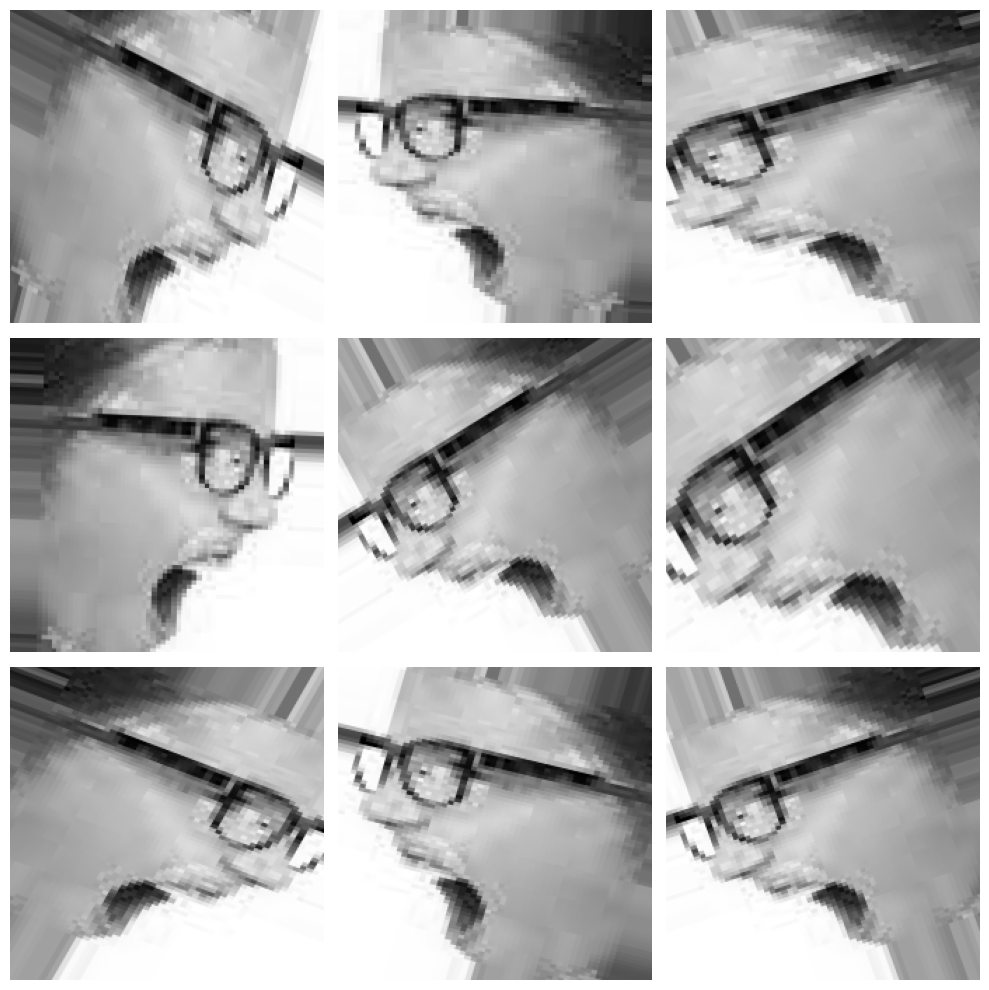

In [35]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    destination,
    x_col='image',
    y_col='class',
    target_size=(img_height, img_width),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

####Arquitetura do Modelo de Rede Neural Convulacional (CNN) para *Deep Learning*

Aqui é especificada uma camada convolucional 2D que possui 64 filtros e usa a função de ativação ReLU. O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência é adicionada uma camada softmax com o número de classes a ser previsto.

In [36]:
model = keras.models.Sequential([
    keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(img_height,img_width,1)),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(128, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),
    #keras.layers.Conv2D(192, (3,3), activation='relu'),
    #keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(256, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Flatten(),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(num_classes, activation='softmax')
])

In [37]:
"""
model= keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(img_height,img_width,1)),
    keras.layers.Conv2D(64,(3,3), padding='same', activation='relu' ),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),
    keras.layers.Conv2D(128,(5,5), padding='same', activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(2, 2)),
    keras.layers.Dropout(0.25),

    keras.layers.Flatten(),
    keras.layers.Dense(256,activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Dense(512,activation = 'relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.25),

    keras.layers.Dense(8, activation='softmax')
])
"""

"\nmodel= keras.models.Sequential([\n    keras.layers.Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(img_height,img_width,1)),\n    keras.layers.Conv2D(64,(3,3), padding='same', activation='relu' ),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    keras.layers.Conv2D(128,(5,5), padding='same', activation='relu'),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    \n    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras.layers.Dropout(0.25),\n    \n    keras.layers.Conv2D(512,(3,3), padding='same', activation='relu', kernel_regularizer=regularizers.l2(0.01)),\n    keras.layers.BatchNormalization(),\n    keras.layers.MaxPool2D(pool_size=(2, 2)),\n    keras

In [38]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      640       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 256)      0

####Treinamento do Modelo Deep Learning

Compilação do modelo Keras com as configurações do treinamento.

optimizer='adam': especifica o otimizador a ser usado durante o treinamento.

loss='categorical_crossentropy': especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação multiclasse, onde a variável alvo tem mais de duas categorias, a perda categórica de entropia cruzada é freqüentemente empregada.

metrics=['accuracy']: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [39]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 20 define o número de épocas de treinamento para o modelo. Uma época representa uma passagem completa por todo o conjunto de dados de treinamento.

Já o método fit() inicia o processo de treinamento do modelo usando o número especificado de épocas.

In [40]:
history=model.fit_generator(train_generator ,
                            steps_per_epoch=5,
                            epochs=5 ,
                            validation_data=val_generator ,
                            validation_steps=3
                            )

Epoch 1/5
5/5 [==============================] - 83s 14s/step - loss: 3.4039 - accuracy: 0.1562 - val_loss: 2.0265 - val_accuracy: 0.2604
Epoch 2/5
5/5 [==============================] - 68s 14s/step - loss: 2.0506 - accuracy: 0.1813 - val_loss: 1.9405 - val_accuracy: 0.3438
Epoch 3/5
5/5 [==============================] - 64s 13s/step - loss: 1.9740 - accuracy: 0.2688 - val_loss: 1.9391 - val_accuracy: 0.3229
Epoch 4/5
5/5 [==============================] - 68s 14s/step - loss: 2.0008 - accuracy: 0.2812 - val_loss: 1.9443 - val_accuracy: 0.2708
Epoch 5/5
5/5 [==============================] - 66s 14s/step - loss: 2.0103 - accuracy: 0.2250 - val_loss: 1.9408 - val_accuracy: 0.2812


####Execução do modelo de deep learning treinado em cada uma das imagens de teste

1/1 [==============================] - 3s 3s/step


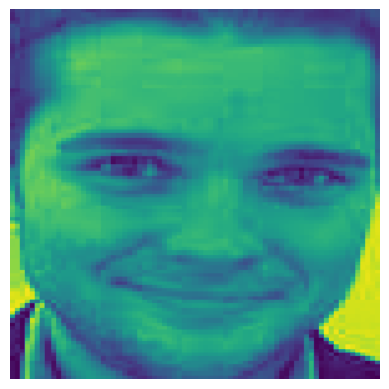

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21993364


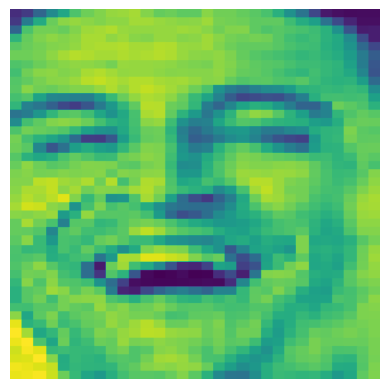

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2680161


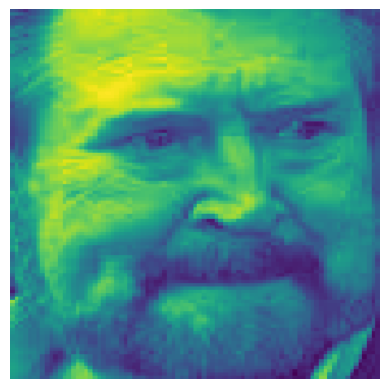

Label:  anger
Previsão:  happiness
Probabilidade:  0.22983727


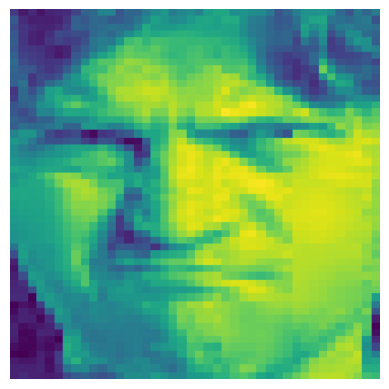

Label:  anger
Previsão:  happiness
Probabilidade:  0.25226513


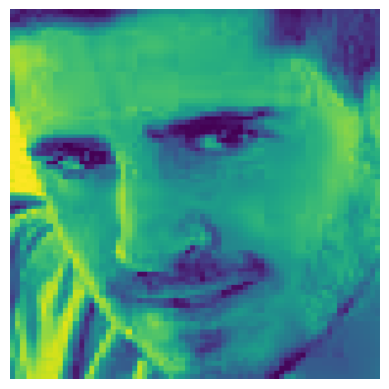

Label:  anger
Previsão:  happiness
Probabilidade:  0.24108507


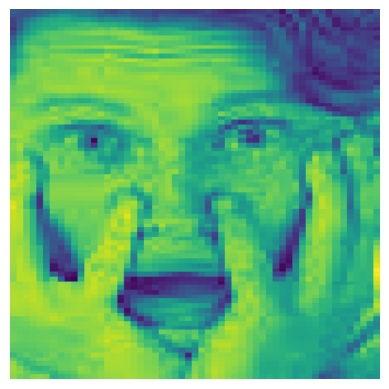

Label:  fear
Previsão:  happiness
Probabilidade:  0.2519677


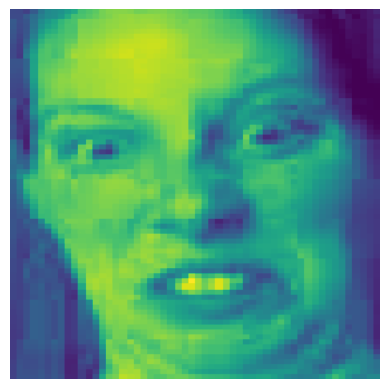

Label:  disgust
Previsão:  happiness
Probabilidade:  0.21194889


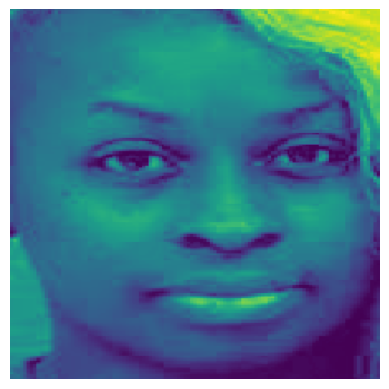

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.1874328


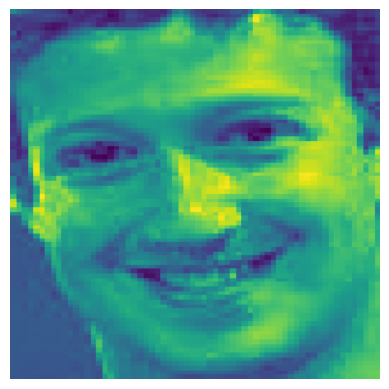

Label:  happiness
Previsão:  happiness
Probabilidade:  0.231745


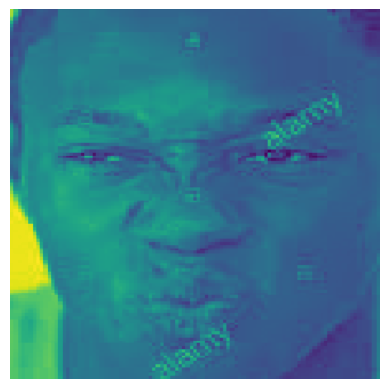

Label:  disgust
Previsão:  happiness
Probabilidade:  0.21330884


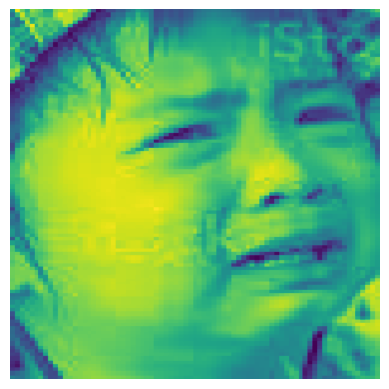

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2638545


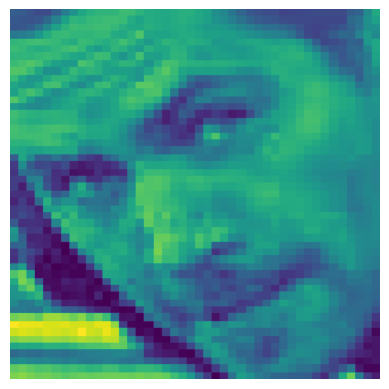

Label:  anger
Previsão:  happiness
Probabilidade:  0.20679864


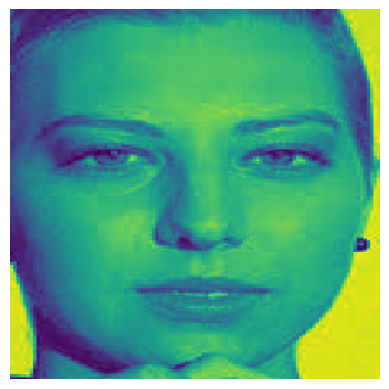

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.23245881


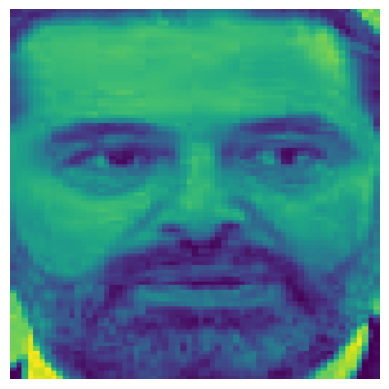

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.20853586


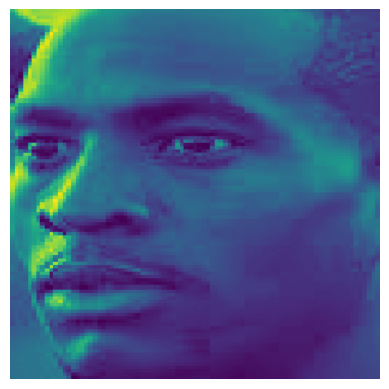

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.18353878


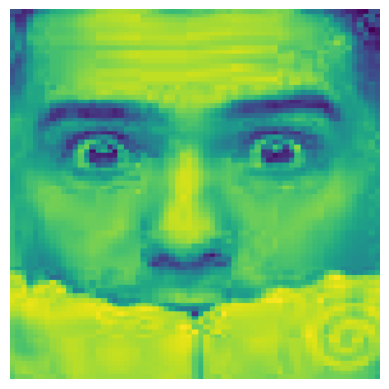

Label:  fear
Previsão:  happiness
Probabilidade:  0.26614213


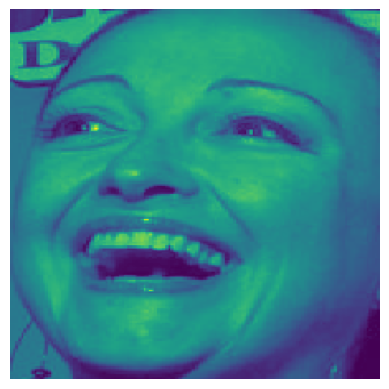

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2206808


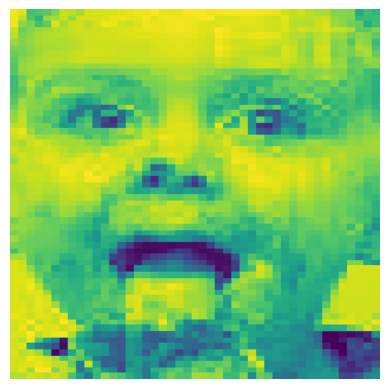

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2760269


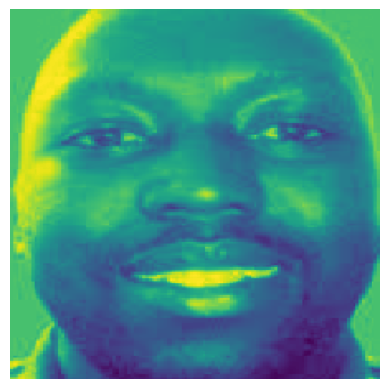

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23189685


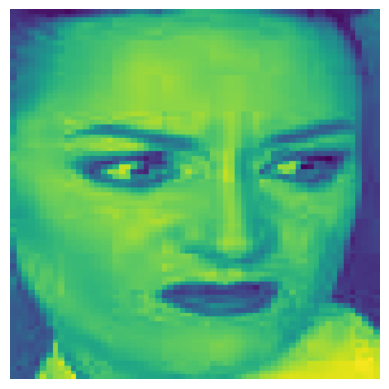

Label:  fear
Previsão:  happiness
Probabilidade:  0.2623605


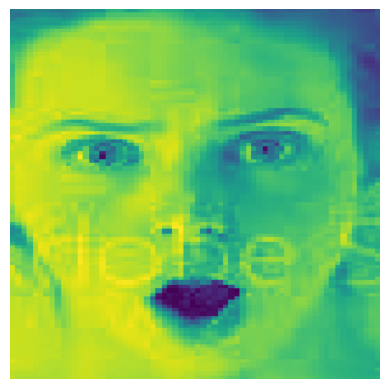

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.2676528


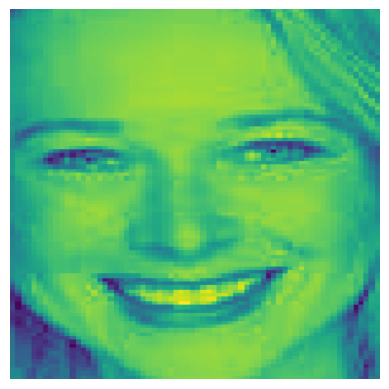

Label:  happiness
Previsão:  happiness
Probabilidade:  0.27275908


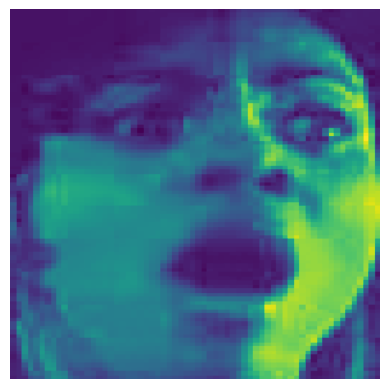

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2145506


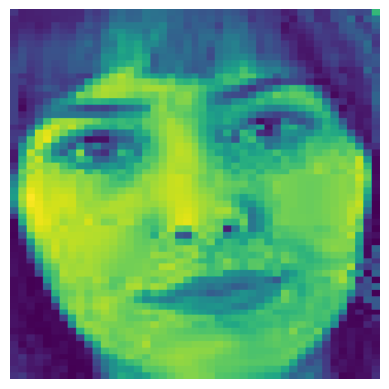

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.22500151


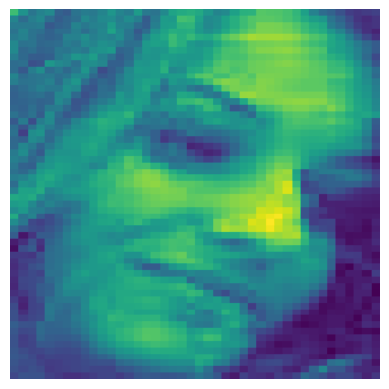

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2127321


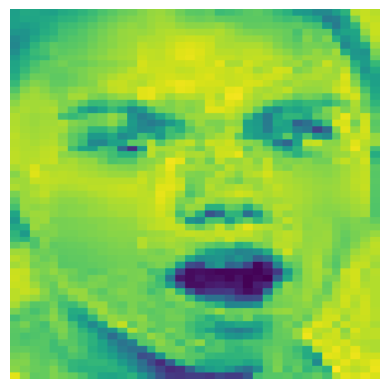

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.2749897


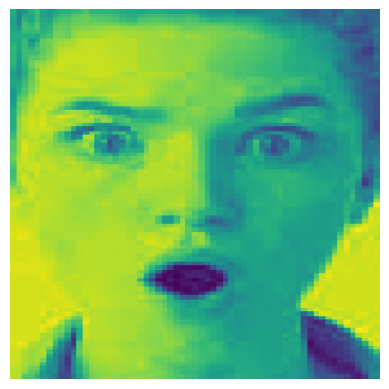

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25837216


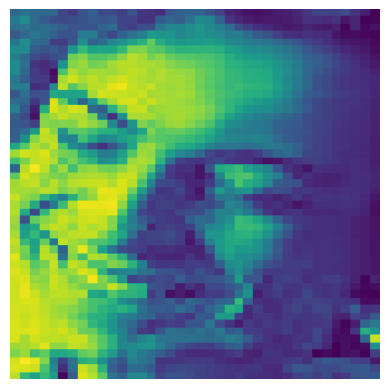

Label:  surprise
Previsão:  happiness
Probabilidade:  0.22394122


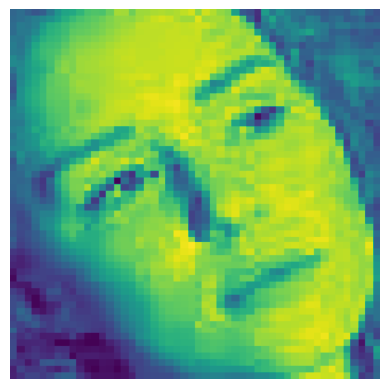

Label:  sadness
Previsão:  happiness
Probabilidade:  0.25300622


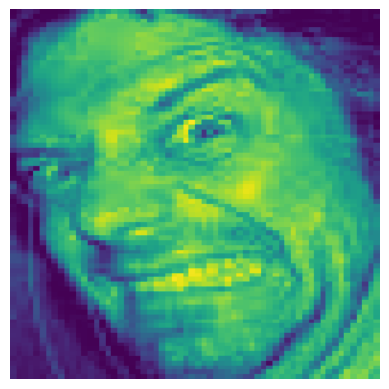

Label:  fear
Previsão:  happiness
Probabilidade:  0.24453011


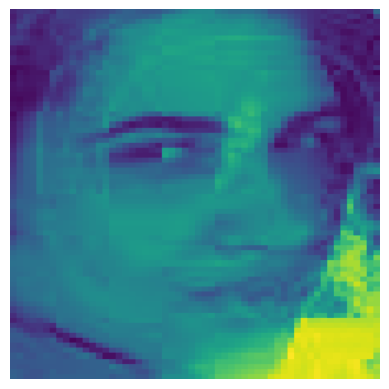

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.22143163


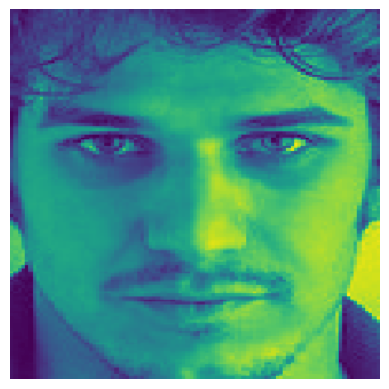

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.23595175
1/1 [==============================] - 3s 3s/step


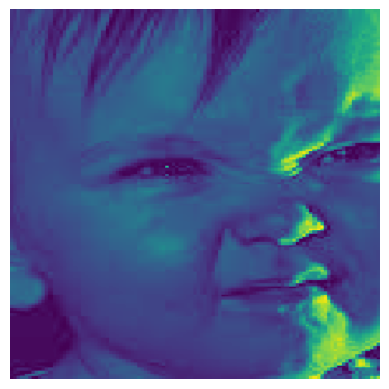

Label:  disgust
Previsão:  happiness
Probabilidade:  0.18665764


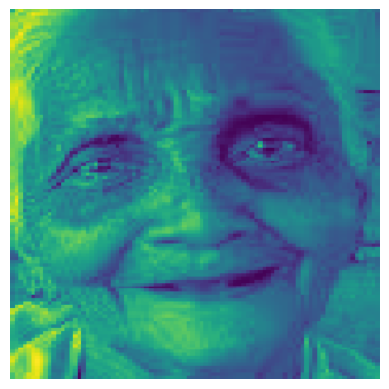

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21647099


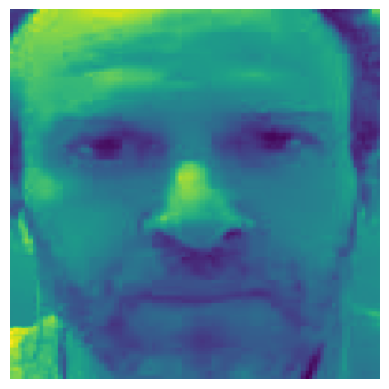

Label:  anger
Previsão:  happiness
Probabilidade:  0.20300692


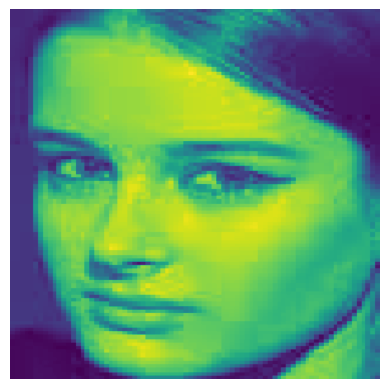

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.24636173


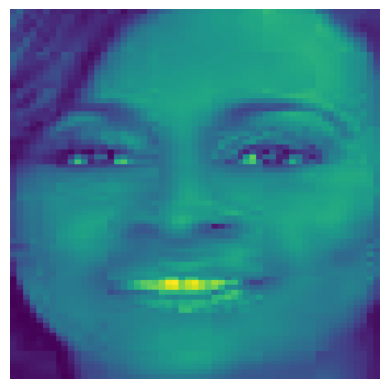

Label:  happiness
Previsão:  happiness
Probabilidade:  0.20419076


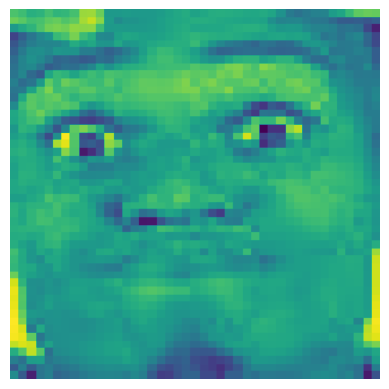

Label:  surprise
Previsão:  happiness
Probabilidade:  0.24447727


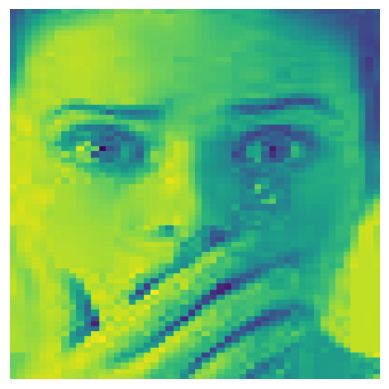

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2628479


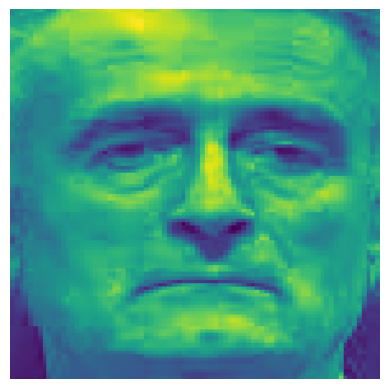

Label:  contempt
Previsão:  happiness
Probabilidade:  0.22116068


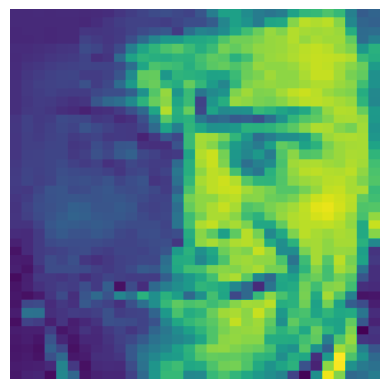

Label:  fear
Previsão:  happiness
Probabilidade:  0.22946867


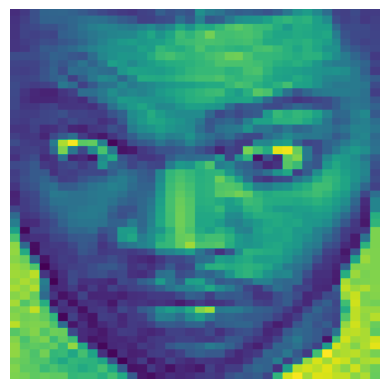

Label:  surprise
Previsão:  happiness
Probabilidade:  0.22061053


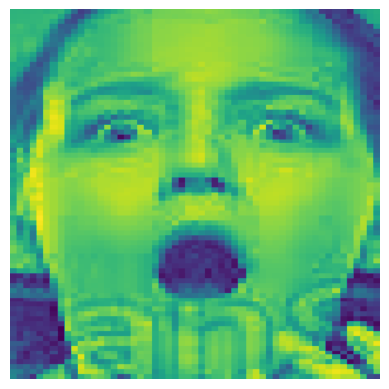

Label:  fear
Previsão:  happiness
Probabilidade:  0.25420982


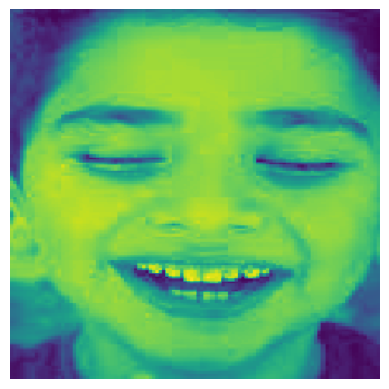

Label:  happiness
Previsão:  happiness
Probabilidade:  0.25762647


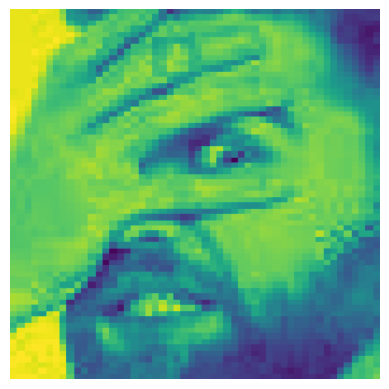

Label:  fear
Previsão:  happiness
Probabilidade:  0.25850818


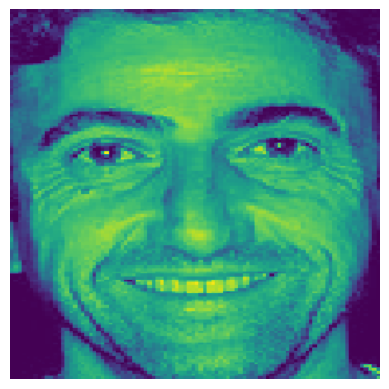

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24799752


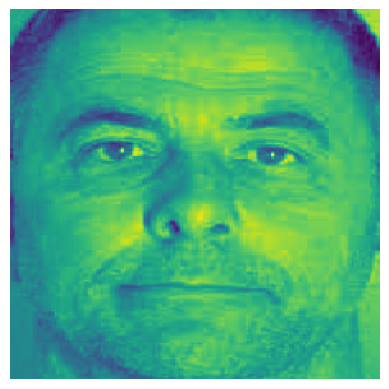

Label:  contempt
Previsão:  happiness
Probabilidade:  0.23038632


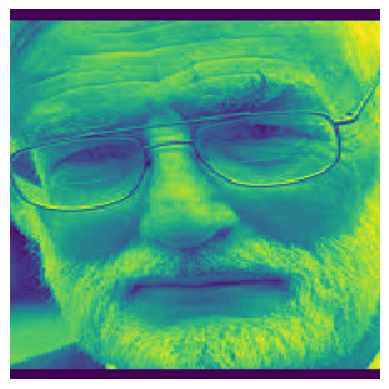

Label:  contempt
Previsão:  happiness
Probabilidade:  0.25461972


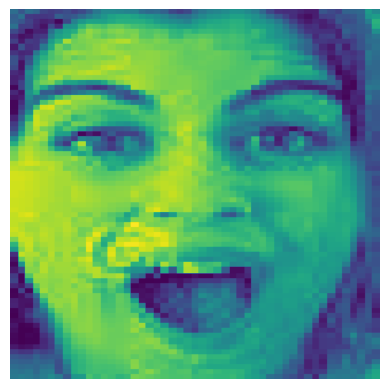

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23232995


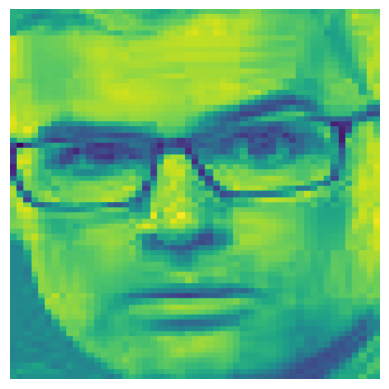

Label:  anger
Previsão:  happiness
Probabilidade:  0.25225082


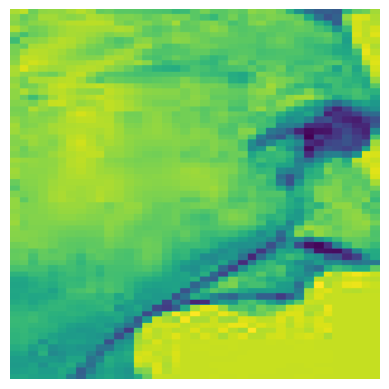

Label:  anger
Previsão:  happiness
Probabilidade:  0.27333054


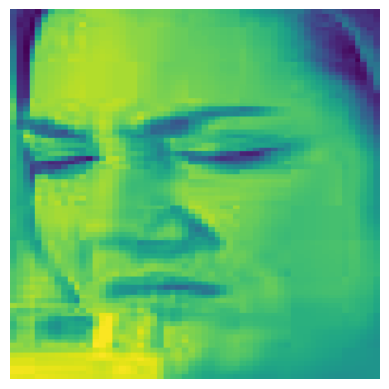

Label:  disgust
Previsão:  happiness
Probabilidade:  0.26897


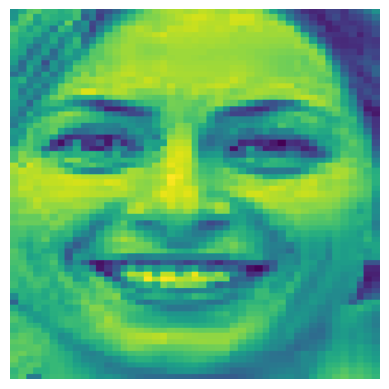

Label:  happiness
Previsão:  happiness
Probabilidade:  0.25427344


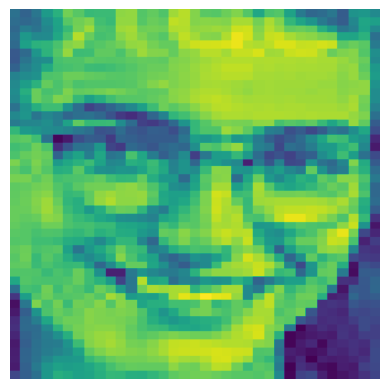

Label:  happiness
Previsão:  happiness
Probabilidade:  0.25584275


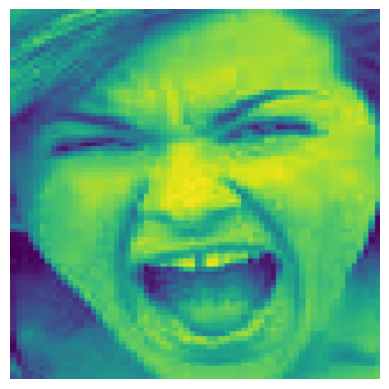

Label:  anger
Previsão:  happiness
Probabilidade:  0.25603512


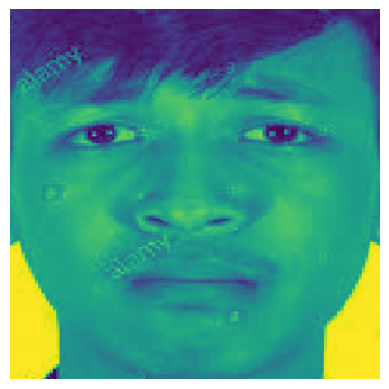

Label:  sadness
Previsão:  happiness
Probabilidade:  0.23857933


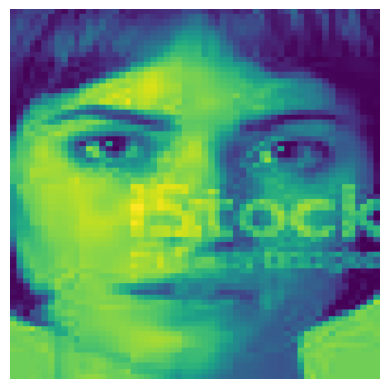

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.23735504


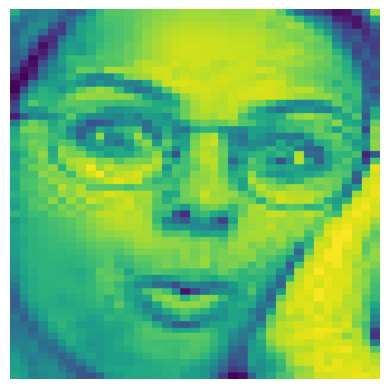

Label:  surprise
Previsão:  happiness
Probabilidade:  0.27004573


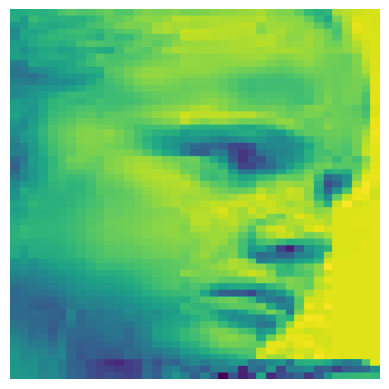

Label:  sadness
Previsão:  happiness
Probabilidade:  0.2633286


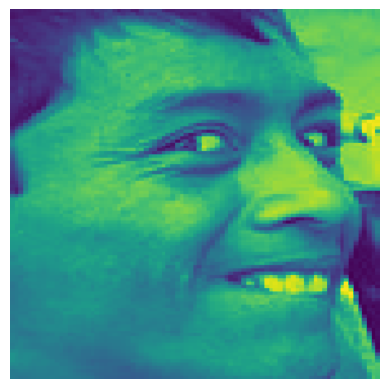

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24019283


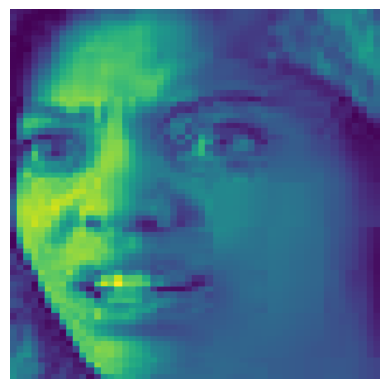

Label:  anger
Previsão:  happiness
Probabilidade:  0.20348941


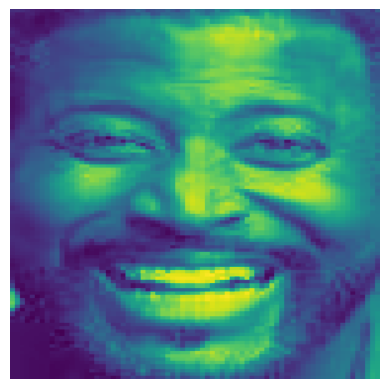

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22492683


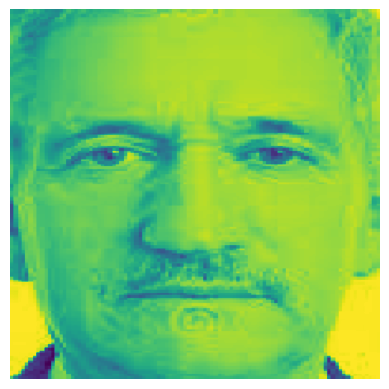

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.28111914


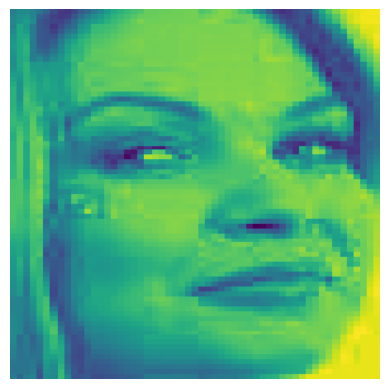

Label:  contempt
Previsão:  happiness
Probabilidade:  0.25765613


In [41]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [42]:
# Calculando as métricas
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.265625
Precision:  0.070556640625
Recall:  0.265625
F1 Score:  0.11149691358024691


In [43]:
len(y_pred)

64

In [44]:
len(y_true)

64

In [45]:
class_names

['anger',
 'contempt',
 'disgust',
 'fear',
 'happiness',
 'neutrality',
 'sadness',
 'surprise']

Matriz de confusão sem normalização


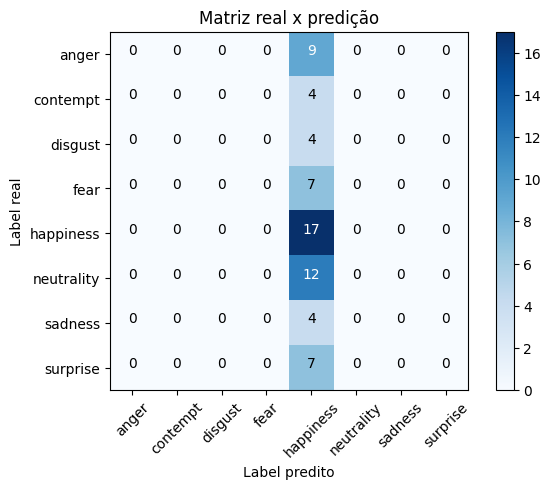

In [46]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['anger',
                               'contempt',
                               'disgust',
                               'fear',
                               'happiness',
                               'neutrality',
                               'sadness',
                               'surprise'],
                      normalize= False,
                      title='Matriz real x predição')

In [47]:
cnf_matrix

array([[ 0,  0,  0,  0,  9,  0,  0,  0],
       [ 0,  0,  0,  0,  4,  0,  0,  0],
       [ 0,  0,  0,  0,  4,  0,  0,  0],
       [ 0,  0,  0,  0,  7,  0,  0,  0],
       [ 0,  0,  0,  0, 17,  0,  0,  0],
       [ 0,  0,  0,  0, 12,  0,  0,  0],
       [ 0,  0,  0,  0,  4,  0,  0,  0],
       [ 0,  0,  0,  0,  7,  0,  0,  0]])

In [48]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'dataset/emotions/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-24T0142.h5


In [49]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-24T0142.h5 carregado com sucesso


1/1 [==============================] - 3s 3s/step


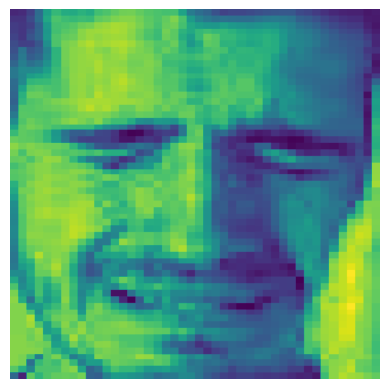

Label:  sadness
Previsão:  happiness
Probabilidade:  0.21457832


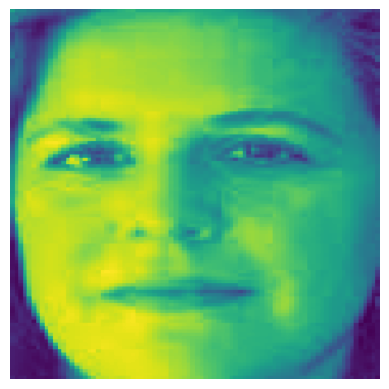

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.25990856


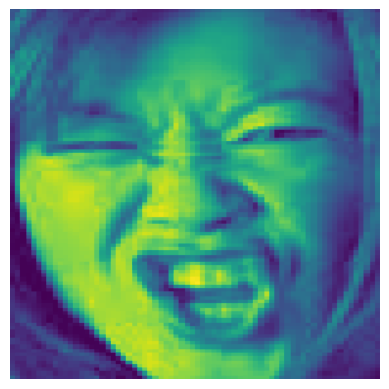

Label:  sadness
Previsão:  happiness
Probabilidade:  0.22639367


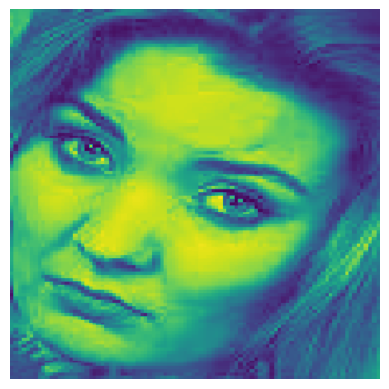

Label:  sadness
Previsão:  happiness
Probabilidade:  0.24736188


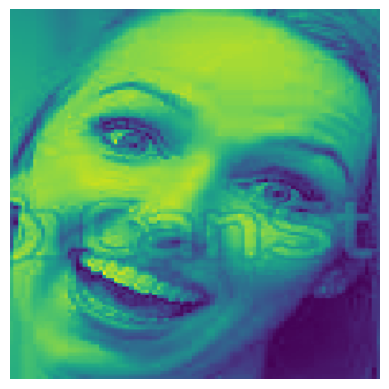

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2391158


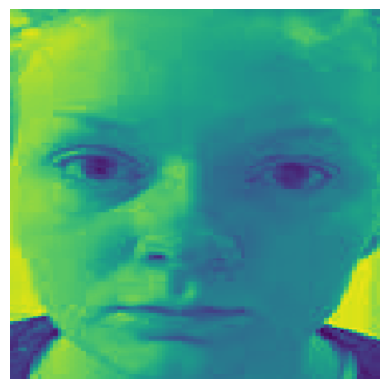

Label:  sadness
Previsão:  happiness
Probabilidade:  0.23432353


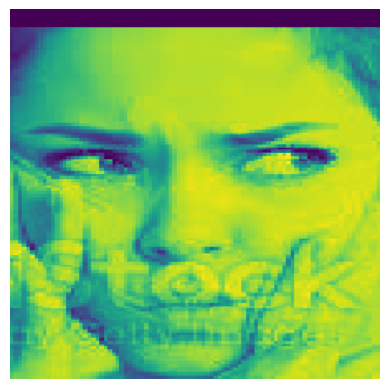

Label:  sadness
Previsão:  happiness
Probabilidade:  0.28711215


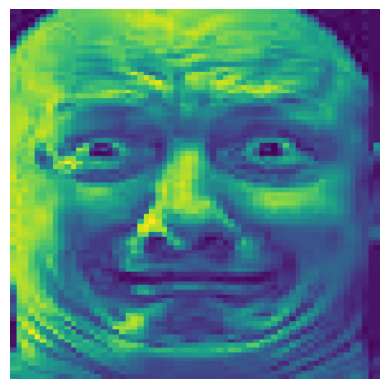

Label:  fear
Previsão:  happiness
Probabilidade:  0.22352801


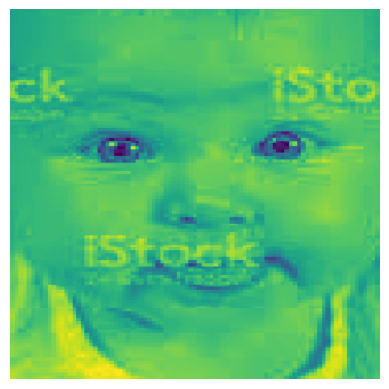

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25279582


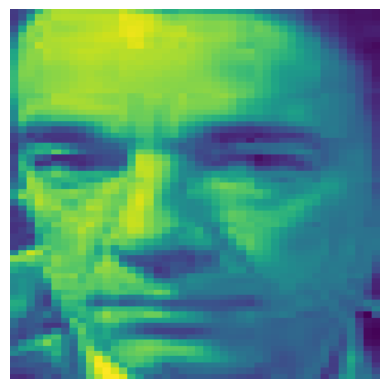

Label:  disgust
Previsão:  happiness
Probabilidade:  0.23750287


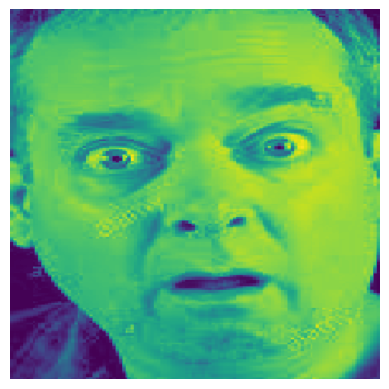

Label:  fear
Previsão:  happiness
Probabilidade:  0.25842425


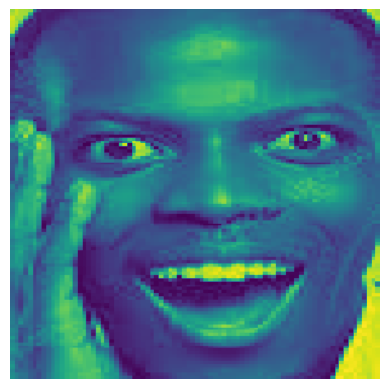

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2177778


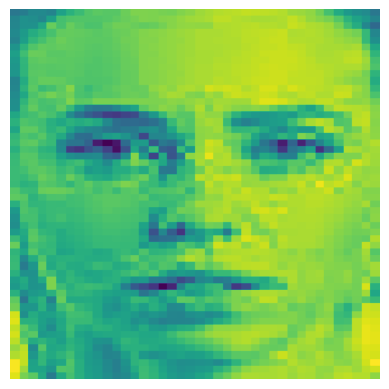

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.27963826


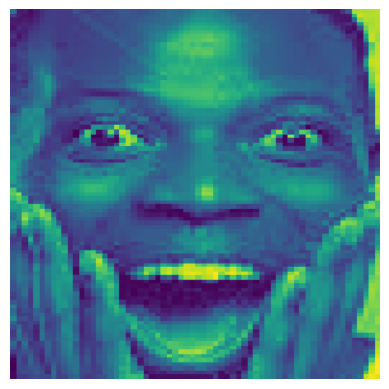

Label:  surprise
Previsão:  happiness
Probabilidade:  0.21484038


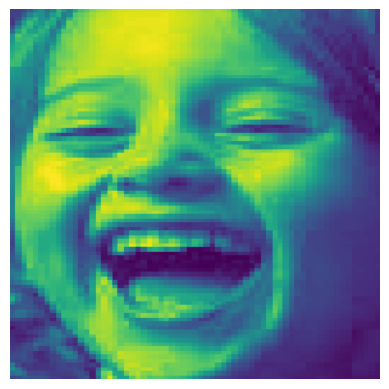

Label:  happiness
Previsão:  happiness
Probabilidade:  0.22654273


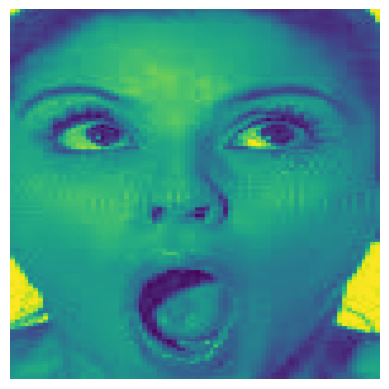

Label:  surprise
Previsão:  happiness
Probabilidade:  0.23347719


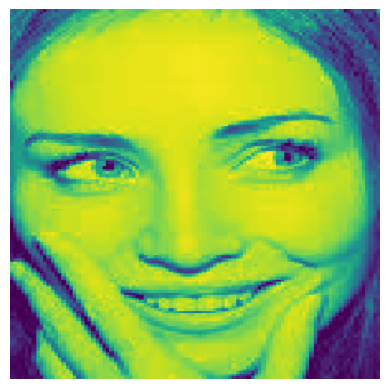

Label:  sadness
Previsão:  happiness
Probabilidade:  0.29249585


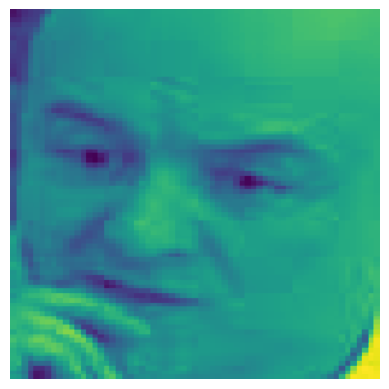

Label:  contempt
Previsão:  happiness
Probabilidade:  0.24076681


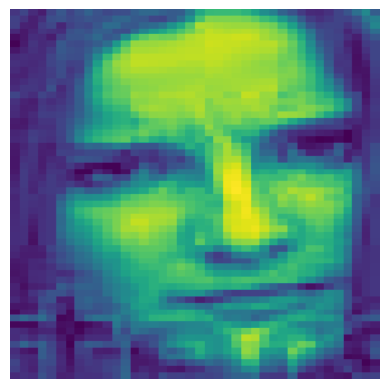

Label:  anger
Previsão:  happiness
Probabilidade:  0.22646749


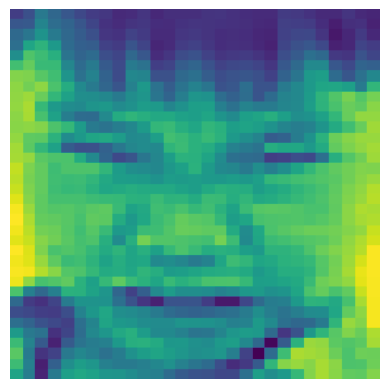

Label:  anger
Previsão:  happiness
Probabilidade:  0.23992538


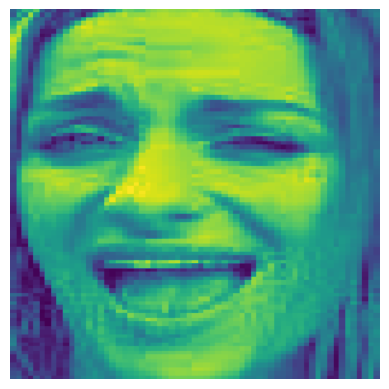

Label:  fear
Previsão:  happiness
Probabilidade:  0.24359192


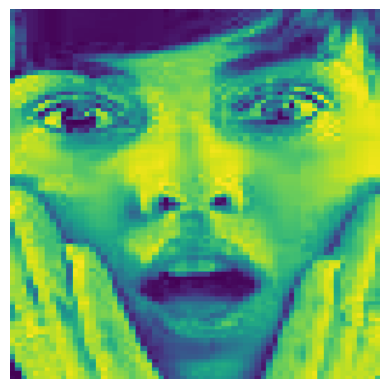

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2678985


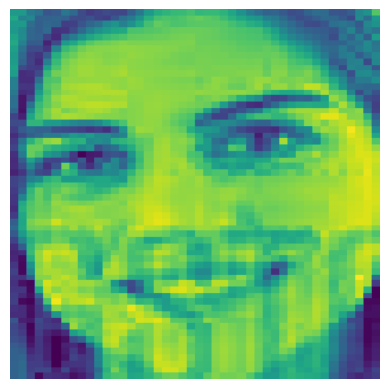

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24963899


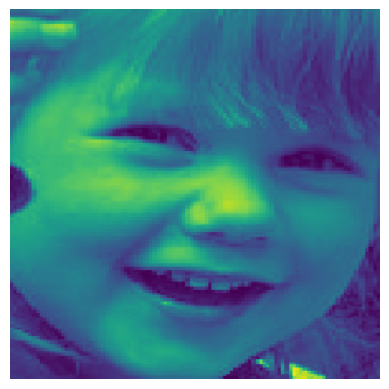

Label:  happiness
Previsão:  happiness
Probabilidade:  0.18941782


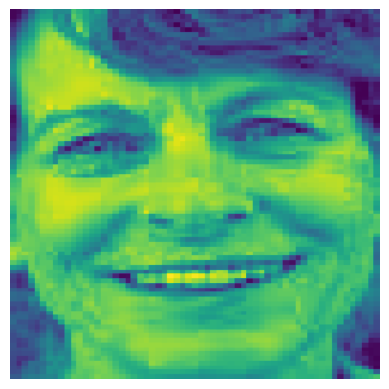

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23839232


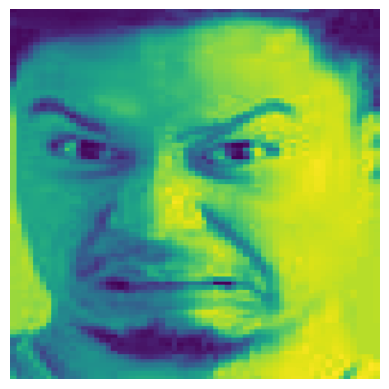

Label:  disgust
Previsão:  happiness
Probabilidade:  0.25253063


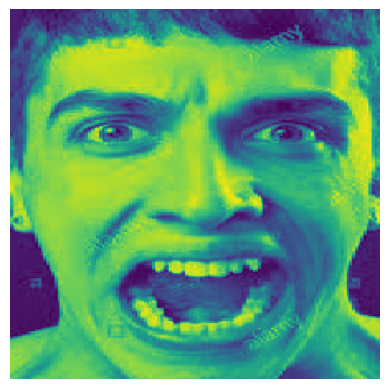

Label:  fear
Previsão:  happiness
Probabilidade:  0.2590552


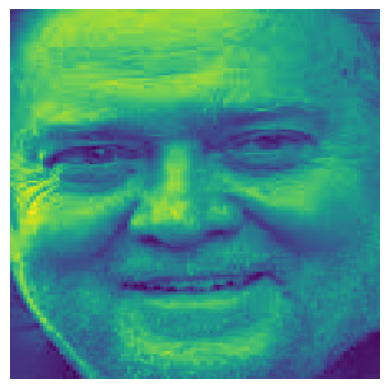

Label:  happiness
Previsão:  happiness
Probabilidade:  0.21471502


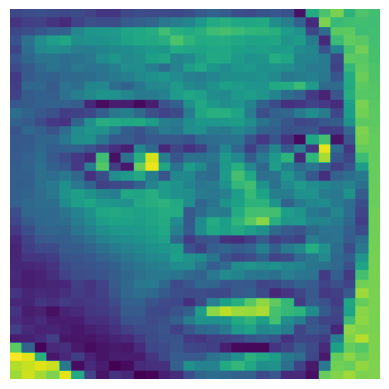

Label:  fear
Previsão:  happiness
Probabilidade:  0.21138248


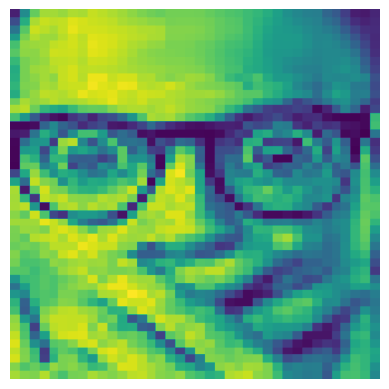

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2561504


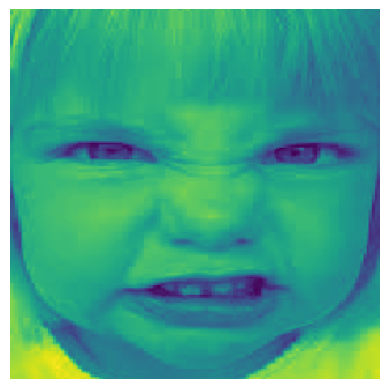

Label:  anger
Previsão:  happiness
Probabilidade:  0.23138039


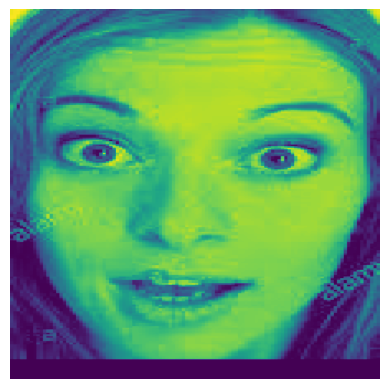

Label:  surprise
Previsão:  happiness
Probabilidade:  0.2509672
1/1 [==============================] - 3s 3s/step


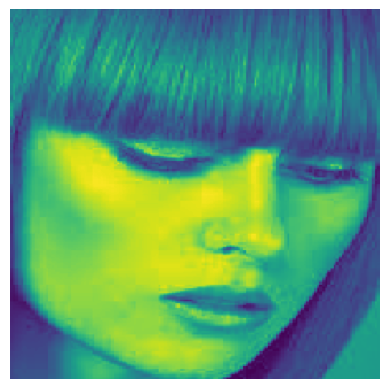

Label:  sadness
Previsão:  happiness
Probabilidade:  0.23747139


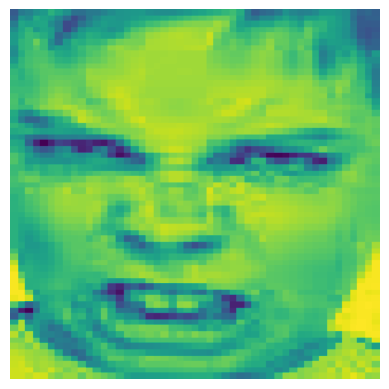

Label:  anger
Previsão:  happiness
Probabilidade:  0.27560657


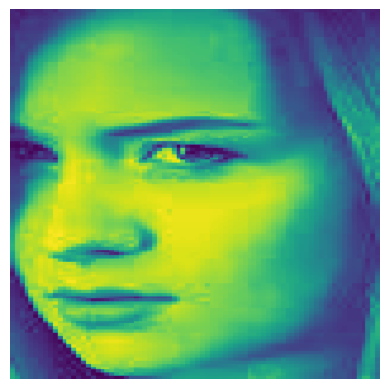

Label:  anger
Previsão:  happiness
Probabilidade:  0.24990763


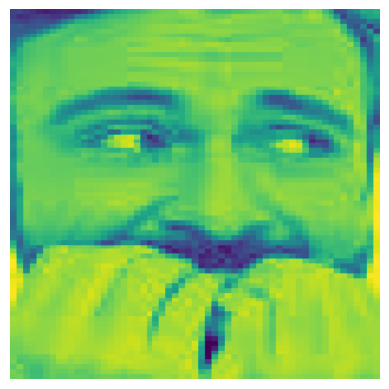

Label:  fear
Previsão:  happiness
Probabilidade:  0.2798894


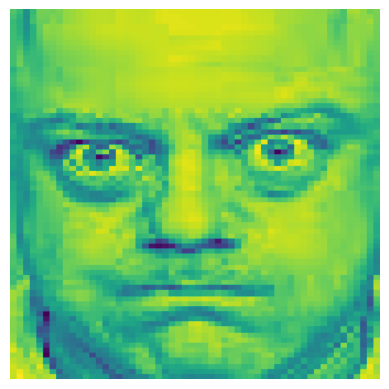

Label:  anger
Previsão:  happiness
Probabilidade:  0.27380463


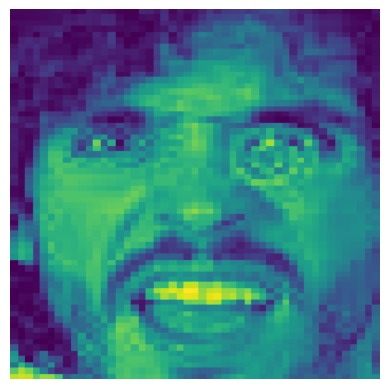

Label:  anger
Previsão:  happiness
Probabilidade:  0.22137694


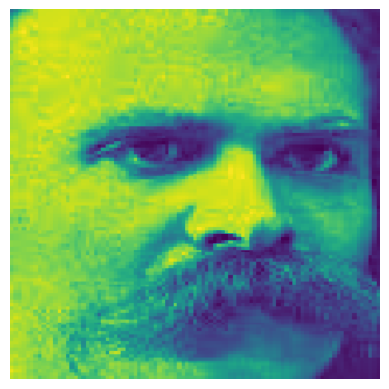

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.24895294


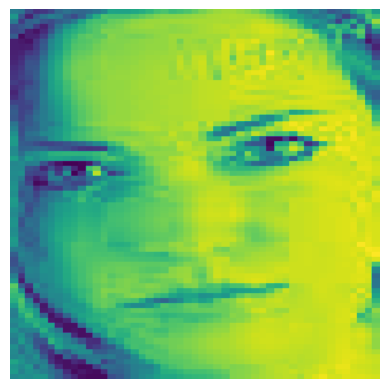

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.2757472


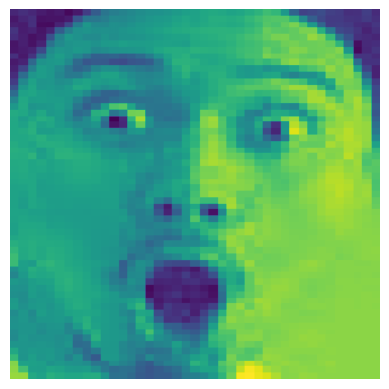

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25129452


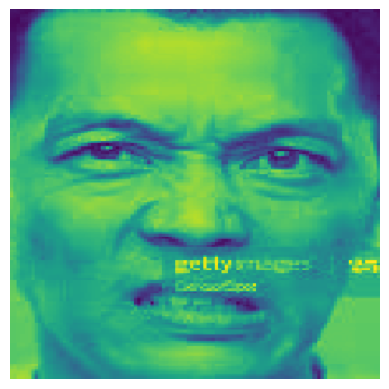

Label:  disgust
Previsão:  happiness
Probabilidade:  0.2567498


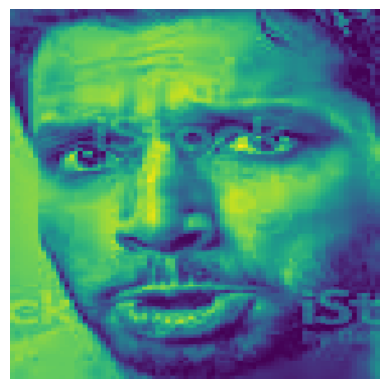

Label:  anger
Previsão:  happiness
Probabilidade:  0.23333398


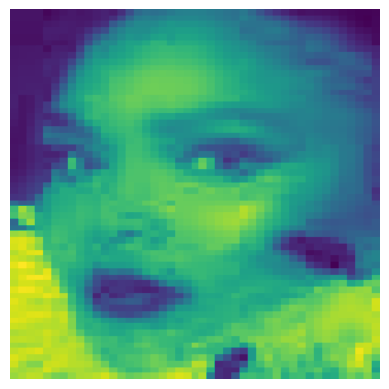

Label:  sadness
Previsão:  happiness
Probabilidade:  0.22873576


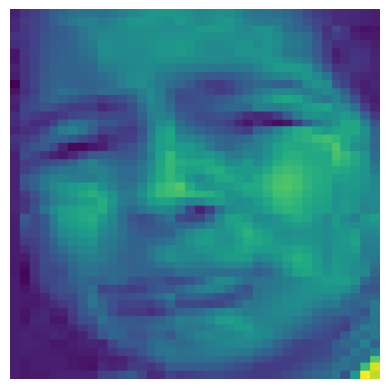

Label:  disgust
Previsão:  happiness
Probabilidade:  0.17943227


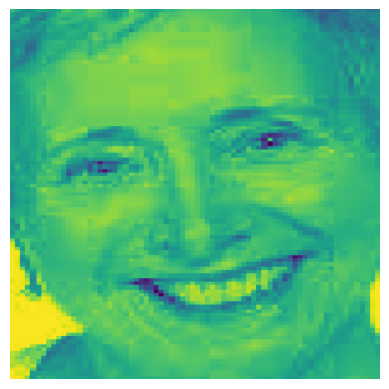

Label:  happiness
Previsão:  happiness
Probabilidade:  0.2706377


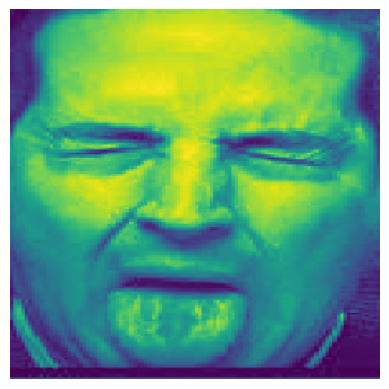

Label:  disgust
Previsão:  happiness
Probabilidade:  0.23777217


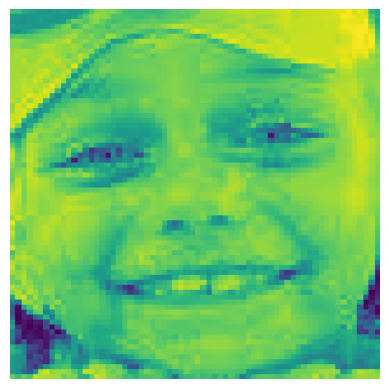

Label:  happiness
Previsão:  happiness
Probabilidade:  0.27073655


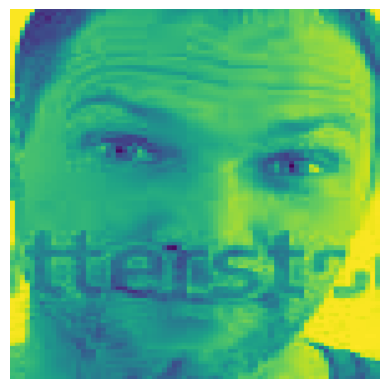

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25903273


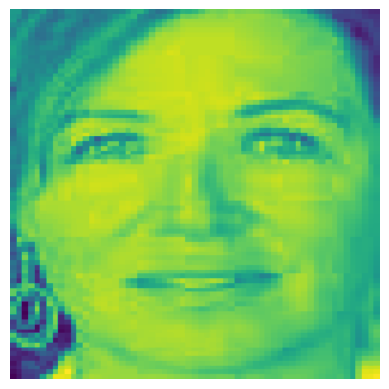

Label:  neutrality
Previsão:  happiness
Probabilidade:  0.27919623


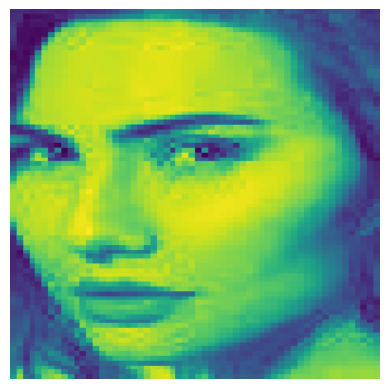

Label:  anger
Previsão:  happiness
Probabilidade:  0.26582476


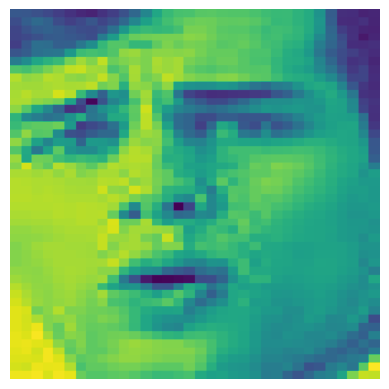

Label:  fear
Previsão:  happiness
Probabilidade:  0.25051636


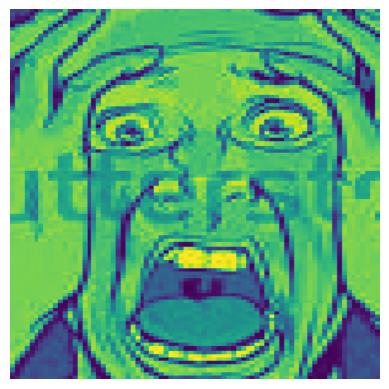

Label:  fear
Previsão:  happiness
Probabilidade:  0.2763243


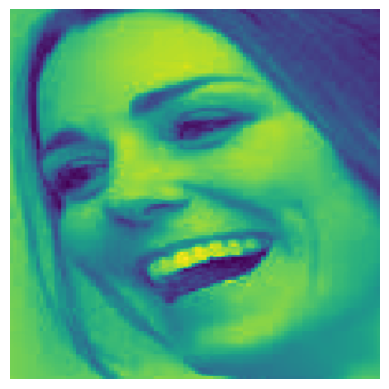

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24388963


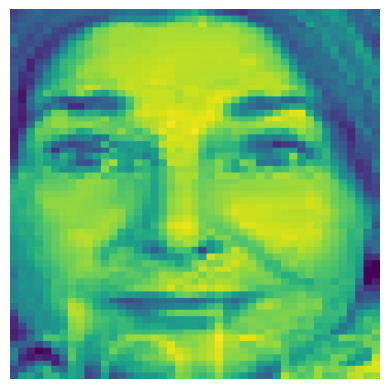

Label:  surprise
Previsão:  happiness
Probabilidade:  0.26018593


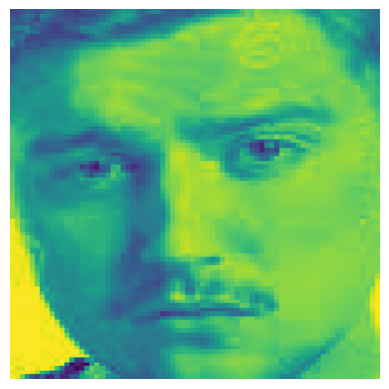

Label:  sadness
Previsão:  happiness
Probabilidade:  0.262886


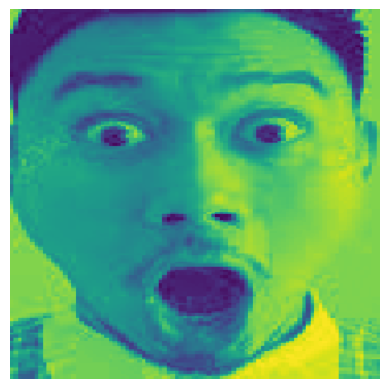

Label:  surprise
Previsão:  happiness
Probabilidade:  0.25963762


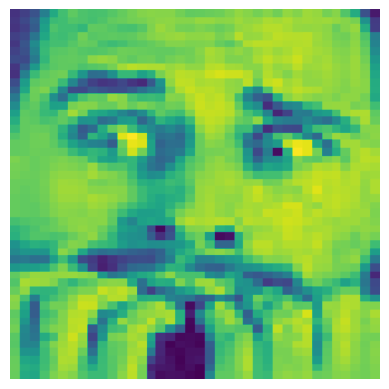

Label:  fear
Previsão:  happiness
Probabilidade:  0.2731889


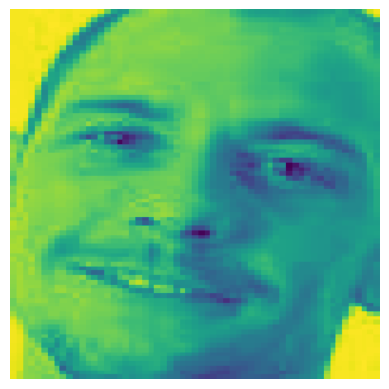

Label:  happiness
Previsão:  happiness
Probabilidade:  0.25415203


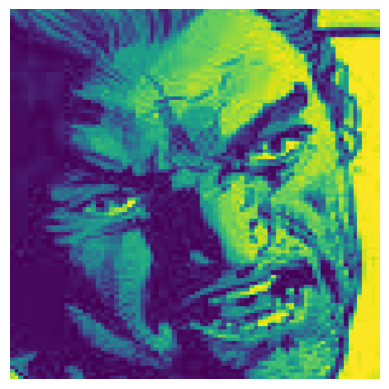

Label:  anger
Previsão:  happiness
Probabilidade:  0.23455335


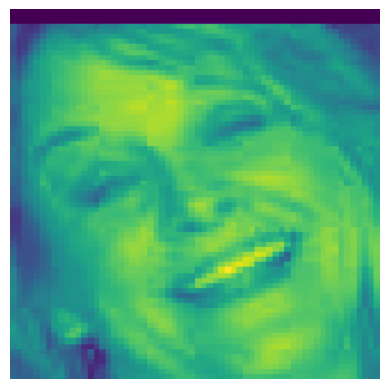

Label:  happiness
Previsão:  happiness
Probabilidade:  0.24006522


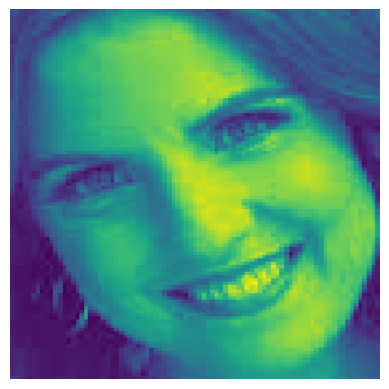

Label:  happiness
Previsão:  happiness
Probabilidade:  0.23301435


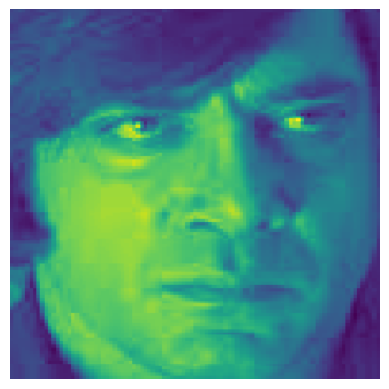

Label:  anger
Previsão:  happiness
Probabilidade:  0.21983162


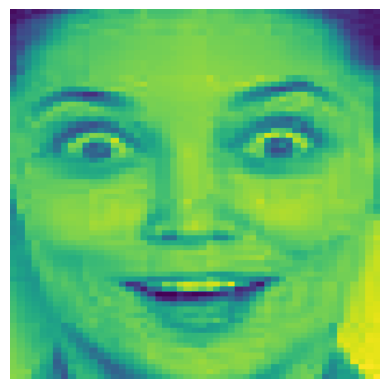

Label:  happiness
Previsão:  happiness
Probabilidade:  0.26270604


In [50]:
count = 0
y_pred = list()
y_true = list()
class_names = ['anger','contempt','disgust','fear','happiness','neutrality','sadness','surprise']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 3:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[np.argmax(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            dict_class={
                0: 'anger',
                1: 'contempt',
                2: 'disgust',
                3: 'fear',
                4: 'happiness',
                5: 'neutrality',
                6: 'sadness',
                7: 'surprise'
            }


            class_name = dict_class.get(predicted_class)
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

Como o treinamento do modelo foi para fins didáticos, não foi possível treinar com um grande volume de dados e épocas, o que melhoraria a convergência e sua acurácia.